## **Problem Statement**
# Forecast Gold Prices
### Business Objective:
#### Data provided is related to gold prices. The objective is to understand the underlying structure in your dataset and come up with a suitable forecasting model which can effectively forecast gold prices for next 30 days.
#### This forecast model will be used by gold exporting and gold importing companies to understand the metal price movements and accordingly set their revenue expectations.


## 1. Introduction:<a class="anchor" id="1"></a>
### What is Forecasting a Time Series?
Time series forecasting is one of the most applied data science techniques in business, finance, supply chain management, production and inventory planning. Many prediction problems involve a time component and thus require extrapolation of time series data, or time series forecasting. Time series forecasting is also an important area of machine learning (ML) and can be cast as a supervised learning problem. ML methods such as Regression, Neural Networks, Support Vector Machines, Random Forests and XGBoost — can be applied to it. Forecasting involves taking models fit on historical data and using them to predict future observations.

Time series forecasting means to forecast or to predict the future value over a period of time. It entails developing models based on previous data and applying them to make observations and guide future strategic decisions.

The future is forecast or estimated based on what has already happened. Time series adds a time order dependence between observations. This dependence is both a constraint and a structure that provides a source of additional information. Before we discuss time series forecasting methods, let’s define time series forecasting more closely.

Time series forecasting is a technique for the prediction of events through a sequence of time. It predicts future events by analyzing the trends of the past, on the assumption that future trends will hold similar to historical trends. It is used across many fields of study in various applications including:

+ Astronomy
+ Business planning
+ Control engineering
+ Earthquake prediction
+ Econometrics
+ Mathematical finance
+ Pattern recognition
+ Resources allocation
+ Signal processing
+ Statistics
+ Weather forecasting

Time series forecasting starts with a historical time series. Analysts examine the historical data and check for patterns of time decomposition, such as trends, seasonal patterns, cyclic patterns and regularity. Many areas within organizations including marketing, finance and sales use some form of time series forecasting to evaluate probable technical costs and consumer demand. Models for time series data can have many forms and represent different stochastic processes.




In [1]:
# Importing Libraries
import numpy as np
import pandas as pd
from scipy.stats import boxcox
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import DataFrame
from pandas import Grouper
from math import sqrt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from collections import Counter
sns.set_style('darkgrid')
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import plotly.express as px
from plotly.offline import plot as off
import plotly.figure_factory as ff
import plotly.io as pio
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, \
                                    train_test_split, RandomizedSearchCV
import warnings
warnings.filterwarnings('ignore')
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression


import pandas as pd
import numpy as np
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
from scalecast.Forecaster import Forecaster


from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

NumExpr defaulting to 4 threads.


In [2]:
# Import Dataset
df = pd.read_csv('Gold_data.csv')
print('Shape of the data',df.shape)
df.head(5)

Shape of the data (2182, 2)


,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75


## 3. Data Exploration


Before doing anything else with the data let's see if there are any null values (missing data) in any of the columns.

In [3]:
df.isnull().any()

date     False
price    False
dtype: bool

In [4]:
df.isnull().sum()

date     0
price    0
dtype: int64

<AxesSubplot:>

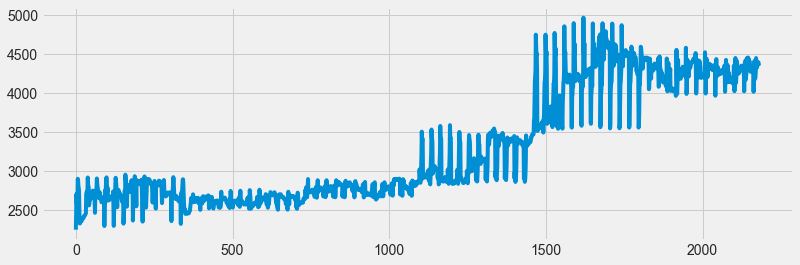

In [5]:
df.price.plot(figsize=(12,4))

- We have no missing data so all the entries are valid for use.

- Now we can check the column names to get a better understanding of what features we will be basing our regression on.

### 3.1 Descriptive Analysis

In [6]:
print ("No. of Rows     : " ,df.shape[0])
print ("No. of Columns  : " ,df.shape[1])
print ("\nFeatures : \n" ,df.columns.tolist())
print ("\nMissing values :\n", df.isnull().any())
print ("\n No. of Unique values :  \n",df.nunique())

No. of Rows     :  2182
No. of Columns  :  2

Features : 
 ['date', 'price']

Missing values :
 date     False
price    False
dtype: bool

 No. of Unique values :  
 date     2182
price    1876
dtype: int64


In [7]:
df.shape

(2182, 2)

In [8]:
#Checking the data types
df.dtypes

date      object
price    float64
dtype: object

In [9]:
#Unique values for every feature
df.nunique()

date     2182
price    1876
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2182 non-null   object 
 1   price   2182 non-null   float64
dtypes: float64(1), object(1)
memory usage: 34.2+ KB


In [11]:
df.date= pd.to_datetime(df.date)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    2182 non-null   datetime64[ns]
 1   price   2182 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 34.2 KB


In [13]:
df[df.duplicated()].shape

(0, 2)

In [14]:
df[df.duplicated()]

,date,price


In [15]:
df.describe()

,price
count,2182.000000
mean,3284.450046
std,719.564434
min,2252.600000
25%,2697.020000
50%,2879.800000
75%,4147.325000
max,4966.300000


### Feature Engineering

#### Making the Date as DateTime index for the Dataframe

In [16]:
df1 = df.copy()
df1.set_index('date',inplace=True)
df1.index.year

Int64Index([2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
            ...
            2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021],
           dtype='int64', name='date', length=2182)

In [17]:
df1.head()

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75


### Separating Month and Year into Separate Column for Visualization and removing meaningful insight of the data

In [18]:
df["date"] = pd.to_datetime(df.date,format="%b-%y")
df["month"] = df.date.dt.strftime("%b") # month extraction
df["year"] = df.date.dt.strftime("%Y") # year extraction
df.head(10)

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
5,2016-01-06,2617.70,Jan,2016
6,2016-01-07,2903.80,Jan,2016
7,2016-01-08,2887.80,Jan,2016
8,2016-01-09,2813.80,Jan,2016
9,2016-01-10,2786.80,Jan,2016


### Data Visualization

In [19]:
df

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
...,...,...,...,...
2177,2021-12-17,4394.40,Dec,2021
2178,2021-12-18,4389.50,Dec,2021
2179,2021-12-19,4389.50,Dec,2021
2180,2021-12-20,4354.10,Dec,2021


In [20]:
df_2016=df.query('year=="2016"')
df_2017=df.query('year=="2017"')
df_2018=df.query('year=="2018"')
df_2019=df.query('year=="2019"')
df_2020=df.query('year=="2020"')
df_2021=df.query('year=="2021"')


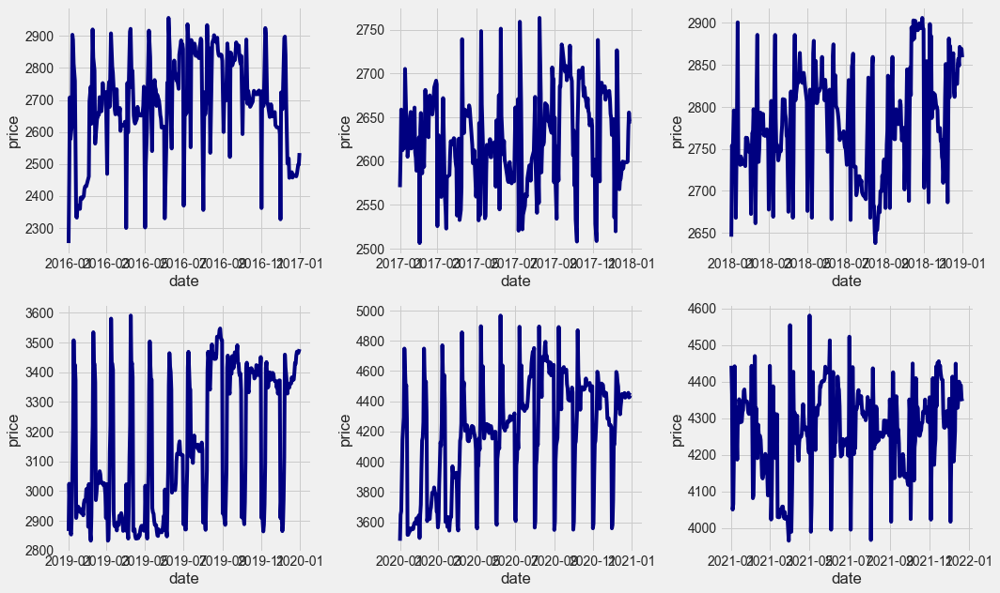

In [21]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9))
sns.lineplot(data=df_2016,x='date',y='price', color='navy',ax=axes[0,0])
sns.lineplot(data=df_2017,x='date',y='price', color='navy',ax=axes[0,1])
sns.lineplot(data=df_2018,x='date',y='price', color='navy',ax=axes[0,2])
sns.lineplot(data=df_2019,x='date',y='price', color='navy',ax=axes[1,0])
sns.lineplot(data=df_2020,x='date',y='price', color='navy',ax=axes[1,1])
sns.lineplot(data=df_2021,x='date',y='price', color='navy',ax=axes[1,2])

plt.tight_layout();
plt.show()

In [22]:
df_2016.head(3)

,date,price,month,year
0,2016-01-01,2252.6,Jan,2016
1,2016-01-02,2454.5,Jan,2016
2,2016-01-03,2708.1,Jan,2016


Text(0.5, 1.0, 'Gold price plot for the year 2016 ,2017 ,2018 ,2019, 2020 & 2021')

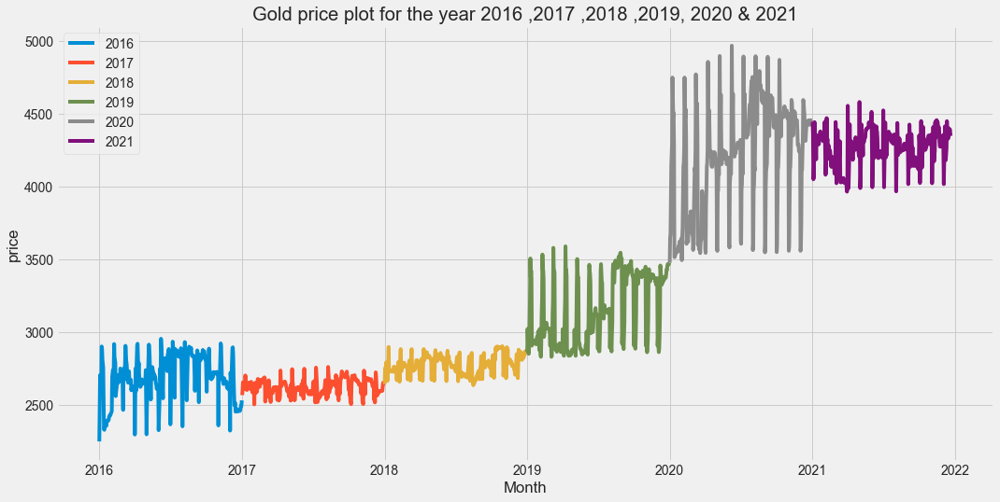

In [23]:
plt.figure(figsize=(16,8))

plt.plot(df_2016['date'], df_2016['price'])
plt.plot(df_2017['date'], df_2017['price'])
plt.plot(df_2018['date'], df_2018['price'])
plt.plot(df_2019['date'], df_2019['price'])
plt.plot(df_2020['date'], df_2020['price'])
plt.plot(df_2021['date'], df_2021['price'])


plt.legend(['2016', '2017','2018','2019','2020','2021'])
plt.xlabel('Month')
plt.ylabel('price')
plt.title('Gold price plot for the year 2016 ,2017 ,2018 ,2019, 2020 & 2021')

###  Line plot

##### Observation: 
1. We can see that there is an increasing Trend. So, Trend is not constant.
2. Variance is also not constant.

Hence the time serise is not stationary.

<AxesSubplot:xlabel='month', ylabel='year'>

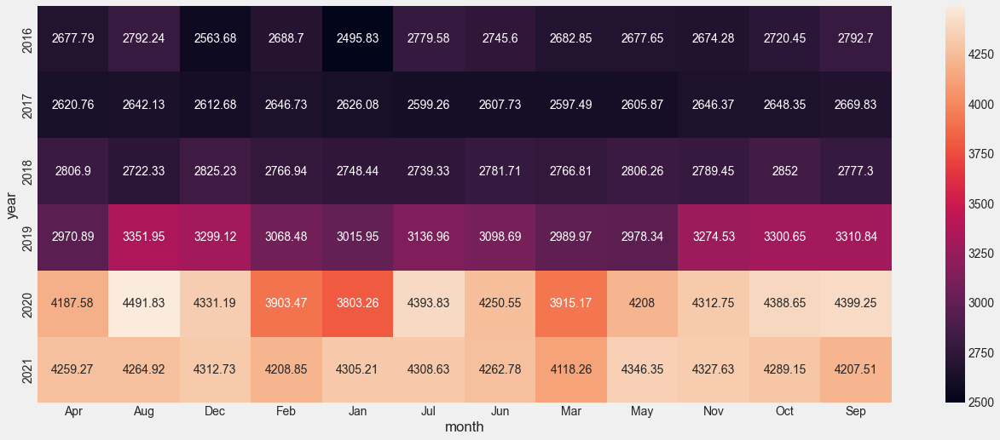

In [24]:
plt.figure(figsize=(20,8))
heatmap_y_month = pd.pivot_table(data=df,values="price",index="year",columns="month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g") #fmt is format of the grid values

In [25]:
heatmap_y_month

month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
year,,,,,,,,,,,,
2016,2677.790000,2792.240323,2563.683333,2688.703448,2495.832258,2779.582258,2745.596667,2682.854839,2677.650000,2674.280000,2720.454839,2792.705000
2017,2620.758333,2642.133871,2612.683871,2646.730357,2626.077957,2599.256452,2607.733333,2597.485484,2605.872581,2646.371667,2648.345161,2669.835000
2018,2806.903333,2722.327419,2825.232258,2766.942857,2748.438710,2739.325806,2781.715000,2766.806452,2806.258065,2789.446667,2851.996774,2777.303333
2019,2970.890000,3351.954839,3299.116129,3068.482143,3015.954839,3136.961290,3098.686667,2989.967742,2978.335484,3274.526667,3300.645161,3310.843333
2020,4187.580000,4491.829032,4331.187097,3903.472414,3803.264516,4393.832258,4250.550000,3915.170968,4208.000000,4312.750000,4388.651613,4399.250000
2021,4259.273333,4264.919355,4312.733333,4208.853571,4305.209677,4308.632258,4262.783333,4118.264516,4346.348387,4327.633333,4289.148387,4207.506667


In [26]:
df.head(2)

,date,price,month,year
0,2016-01-01,2252.6,Jan,2016
1,2016-01-02,2454.5,Jan,2016


In [27]:
df_yearwise_agg=df.set_index("date")['2016':'2021'][['year','price']].groupby('year').agg({'price':['min','max','mean','median','std']})

In [28]:
df_yearwise_agg

price                                          
         min     max         mean   median         std
year                                                  
2016  2252.6  2956.6  2690.614162  2704.75  146.639798
2017  2506.5  2763.4  2626.676484  2625.10   50.634343
2018  2637.9  2906.0  2781.938082  2778.40   60.387230
2019  2832.7  3590.4  3150.210685  3115.10  236.765777
2020  3477.6  4966.3  4216.378689  4276.90  362.345350
2021  3965.3  4580.3  4266.871549  4282.80  113.907651

### Yearly Gold Price Analysis

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


<AxesSubplot:xlabel='year', ylabel='price'>

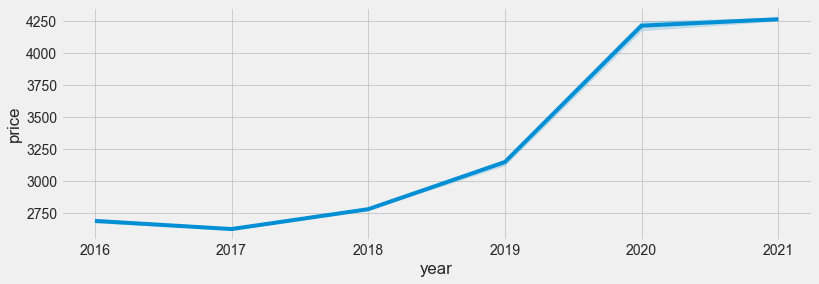

In [29]:
plt.figure(figsize=(12,4))
sns.lineplot(x="year",y="price",data=df)




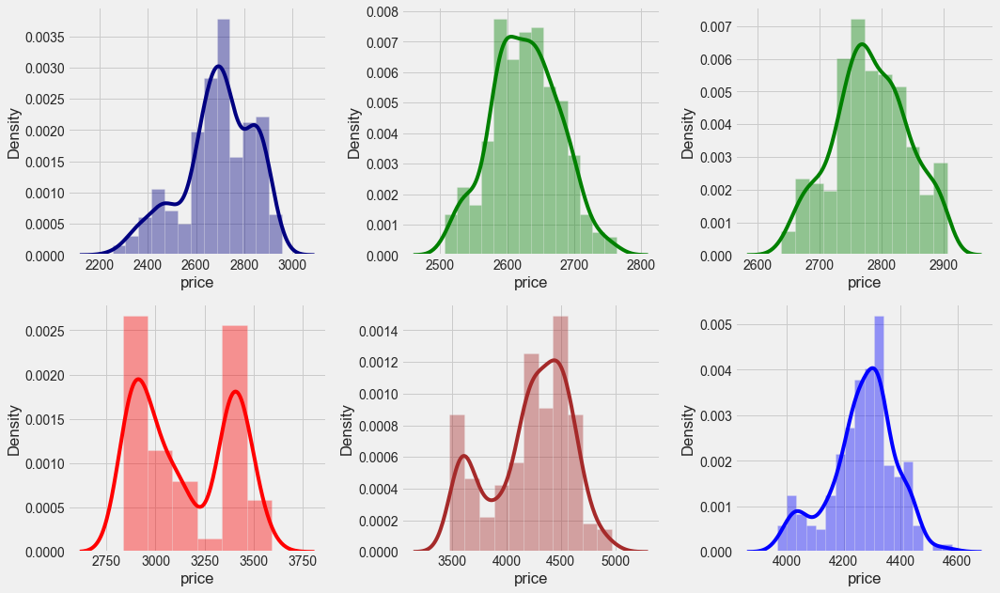

In [30]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9))
sns.distplot(df.query('year=="2016"')["price"], color='navy',ax=axes[0,0])
sns.distplot(df.query('year=="2017"')["price"], color='green',ax=axes[0,1])
sns.distplot(df.query('year=="2018"')["price"], color='green',ax=axes[0,2])
sns.distplot(df.query('year=="2019"')["price"], color='red',ax=axes[1,0])
sns.distplot(df.query('year=="2020"')["price"], color='brown',ax=axes[1,1])
sns.distplot(df.query('year=="2021"')["price"], color='blue',ax=axes[1,2])
plt.tight_layout();
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 360)'>

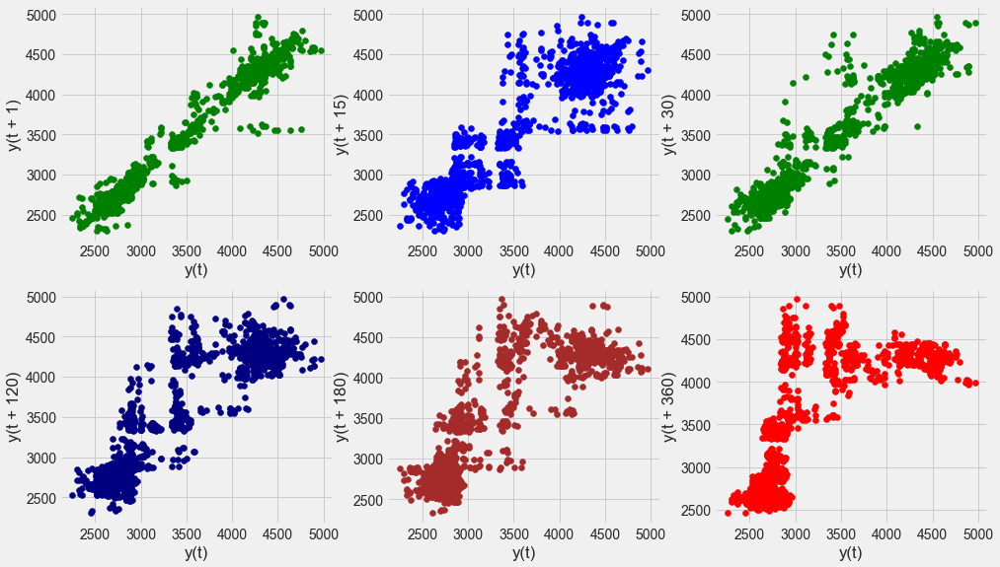

In [31]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 9))
pd.plotting.lag_plot(df['price'],lag=1, c='green',ax=axes[0,0])
pd.plotting.lag_plot(df['price'],lag=15, c='blue',ax=axes[0,1])
pd.plotting.lag_plot(df['price'],lag=30, c='green',ax=axes[0,2])
pd.plotting.lag_plot(df['price'],lag=120, c='navy',ax=axes[1,0])
pd.plotting.lag_plot(df['price'],lag=180, c='brown',ax=axes[1,1])
pd.plotting.lag_plot(df['price'],lag=360, c='red',ax=axes[1,2])


### Box Plot of Each Year by Monthly Intervals

<AxesSubplot:xlabel='year', ylabel='price'>

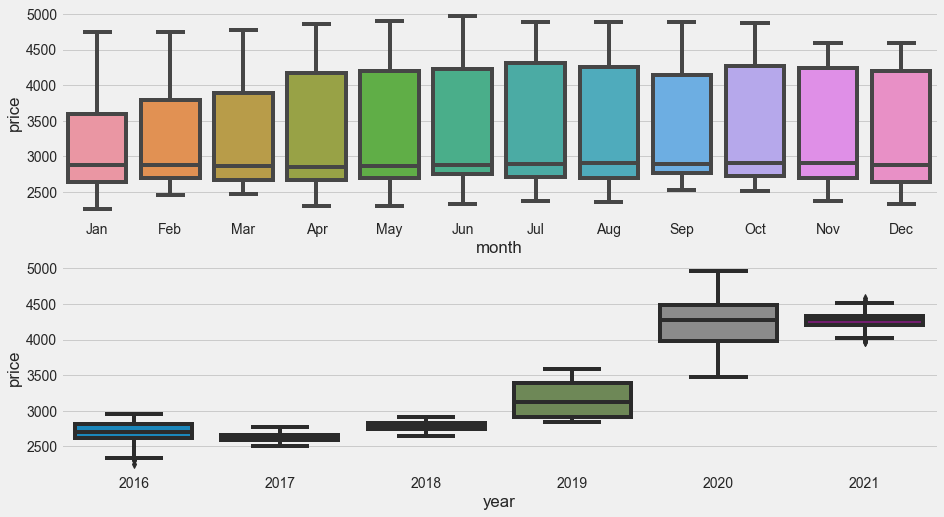

In [32]:
# Boxplot for ever
plt.figure(figsize=(14,8))
plt.subplot(211)
sns.boxplot(x="month",y="price",data=df)
plt.subplot(212)
sns.boxplot(x="year",y="price",data=df)

### Histogram and Density Plots

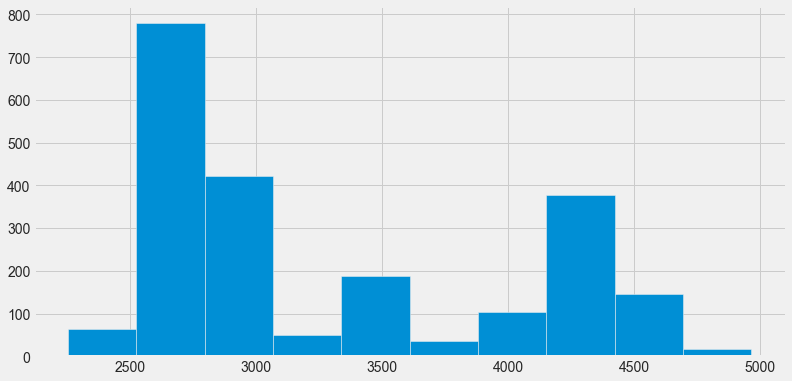

In [33]:
df.price.hist(figsize=(12,6))
plt.show()

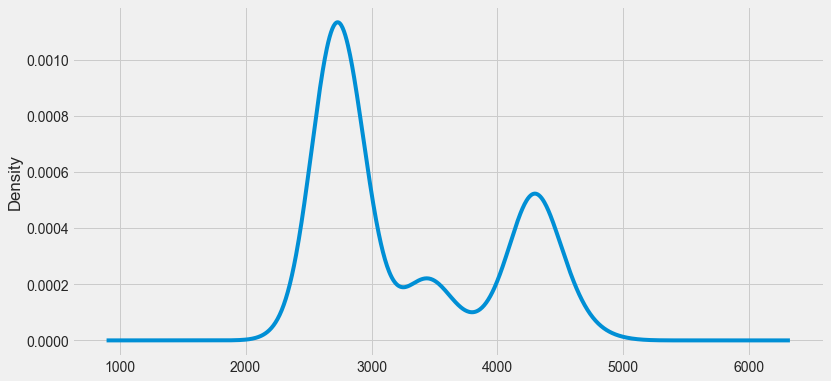

In [34]:
# create a density plot
df.price.plot(kind='kde', figsize=(12,6))
plt.show()

### Lag plot

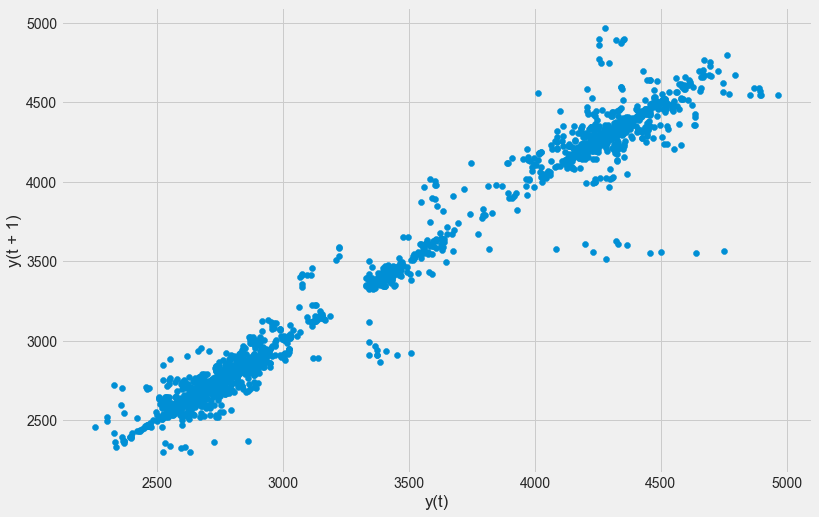

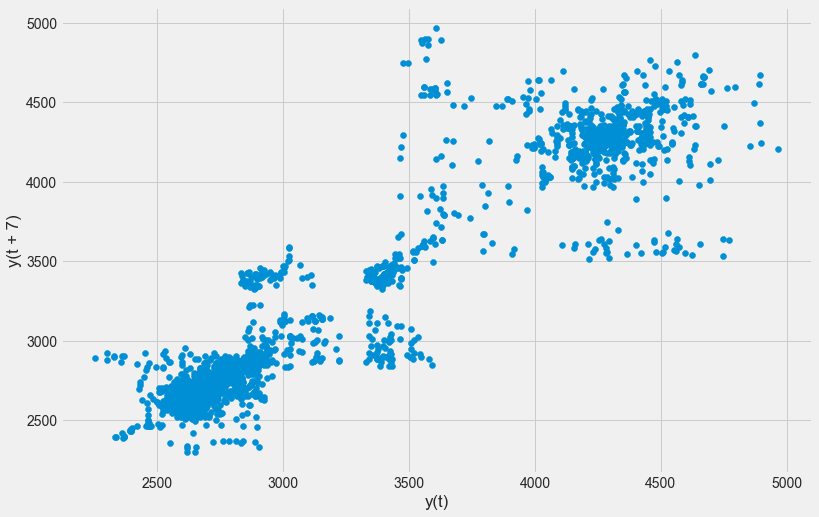

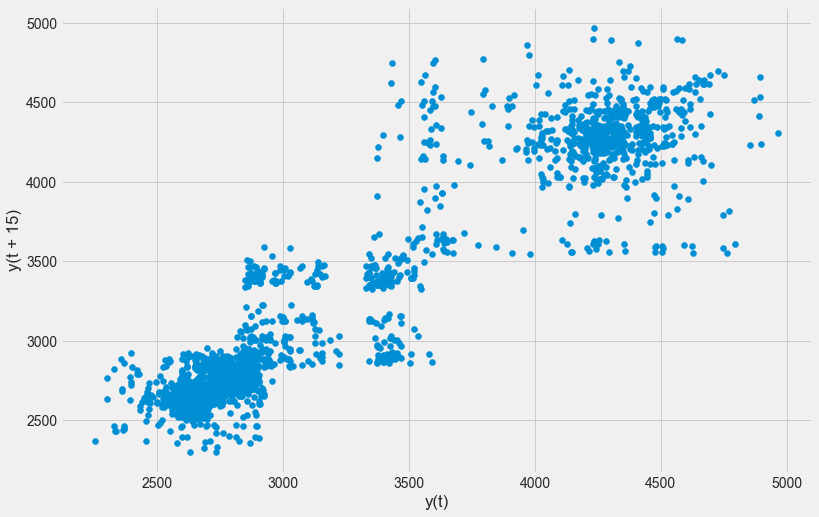

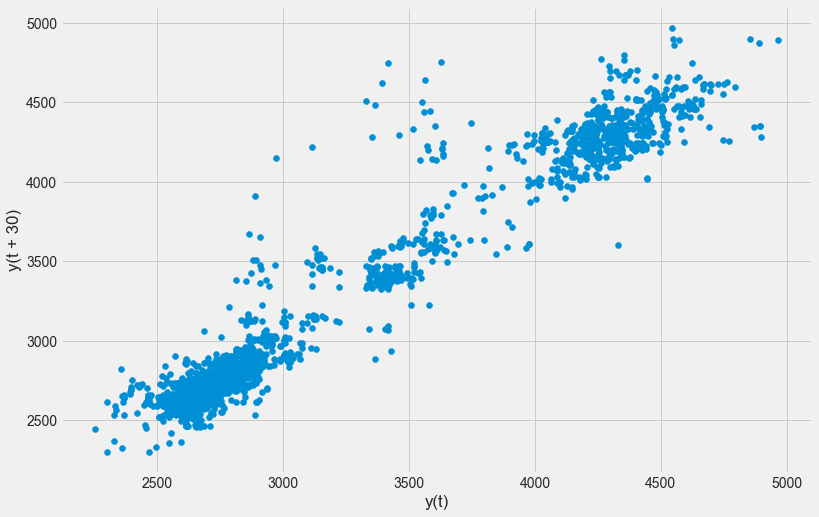

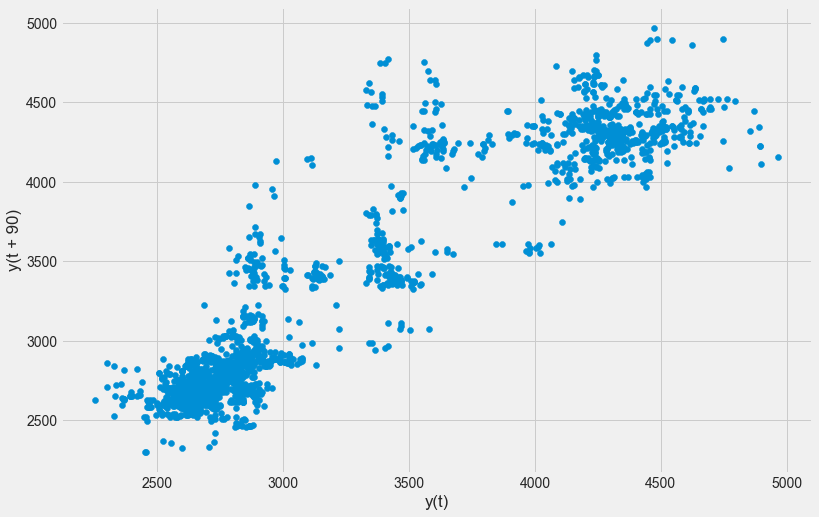

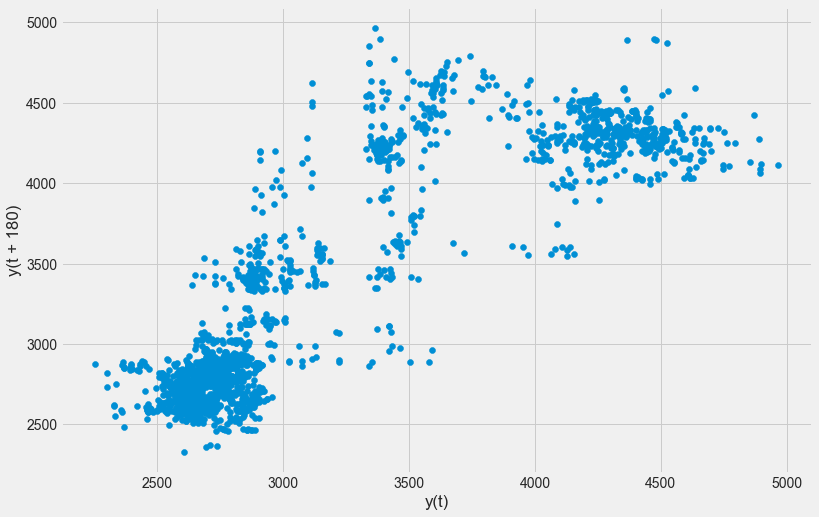

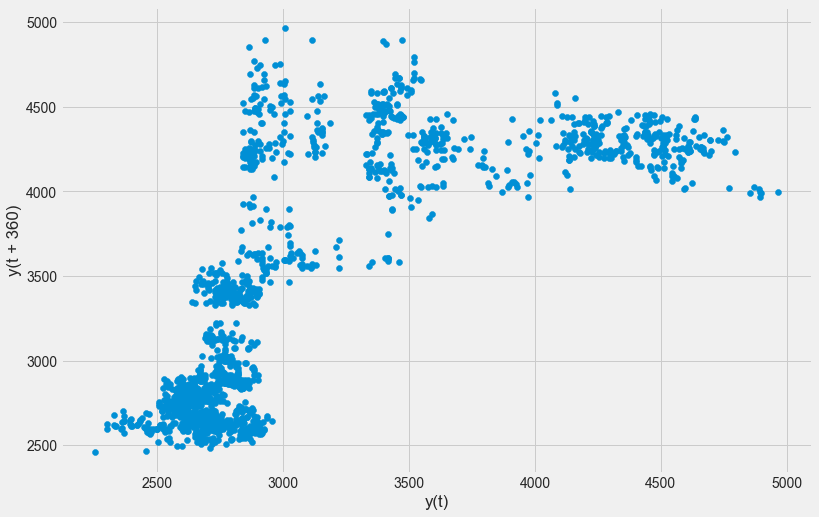

In [35]:
  
# create a scatter plot
for i in [1, 7, 15, 30, 90, 180, 360]:
    plt.figure(figsize=(12,8))
    lag_plot(df.price, lag=i)
    plt.show()

### Moving Average

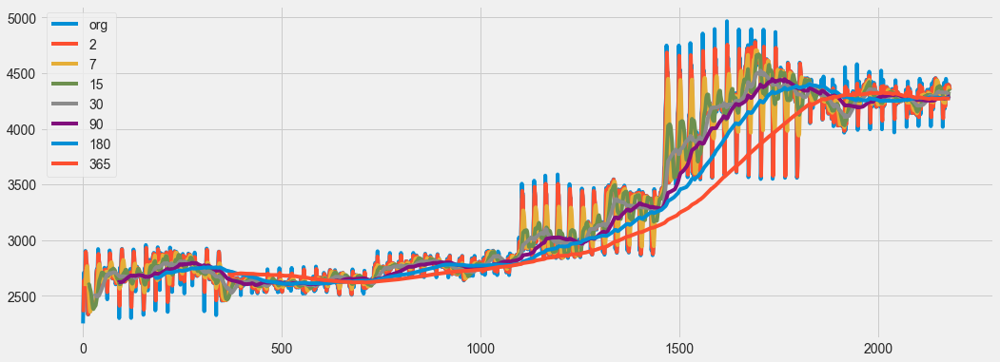

In [36]:
plt.figure(figsize=(16,6))
df.price.plot(label="org")
lis=[2,7,15,30,90,180,365]

for i in lis:
    df["price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

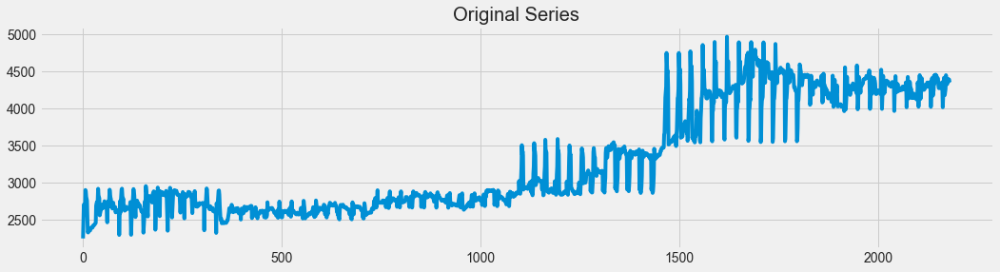

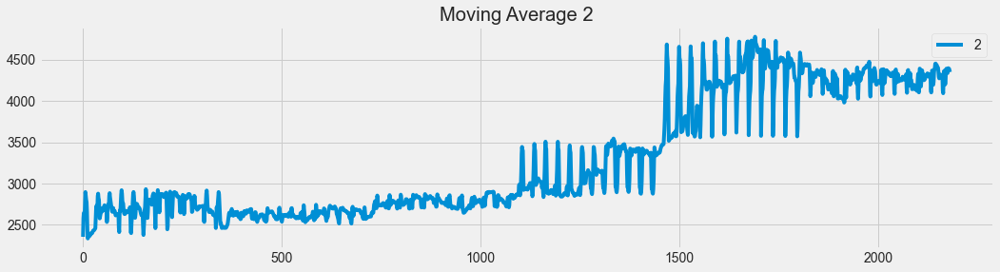

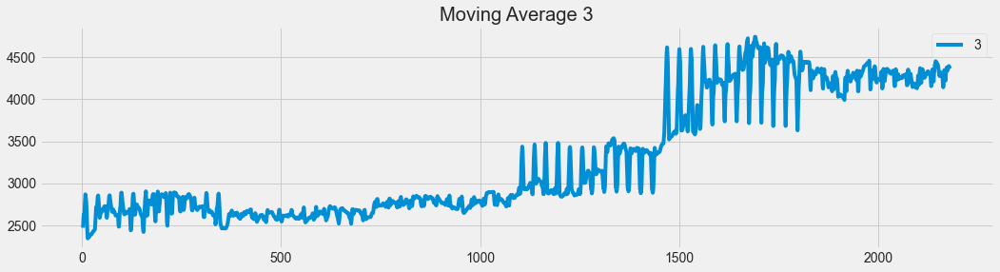

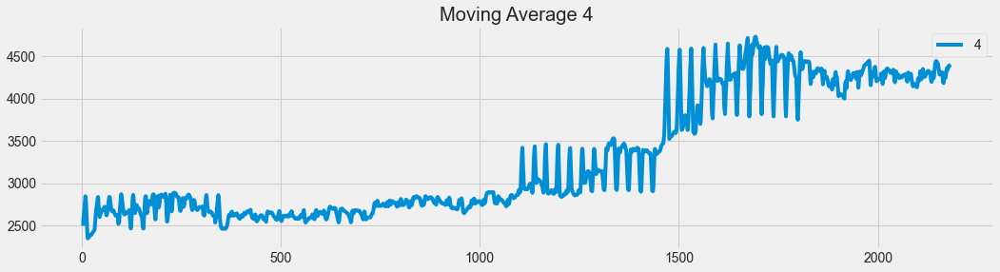

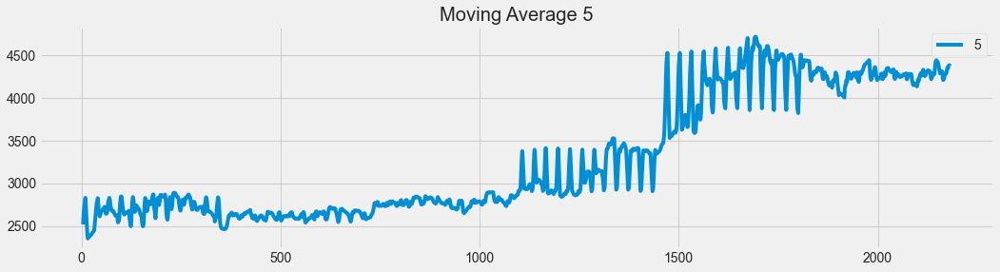

...

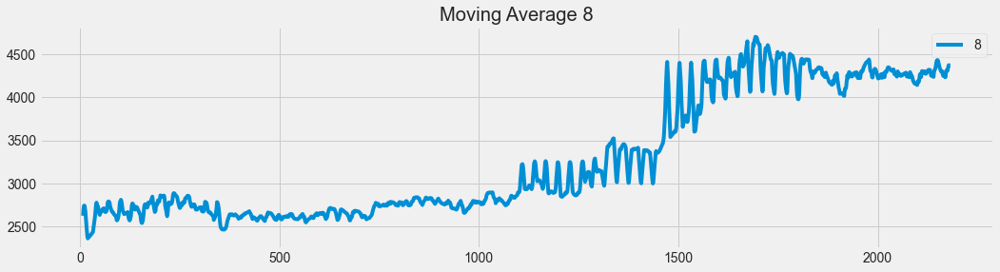

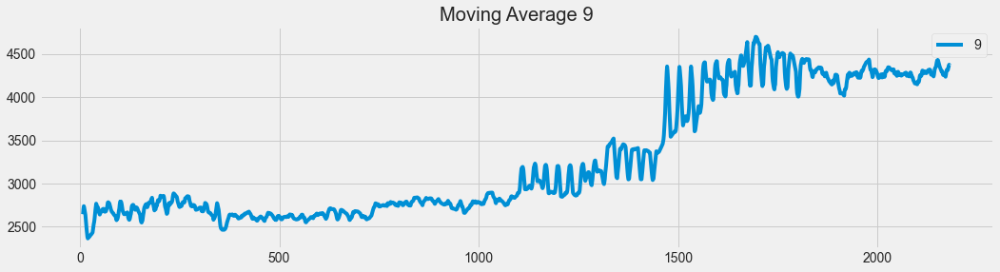

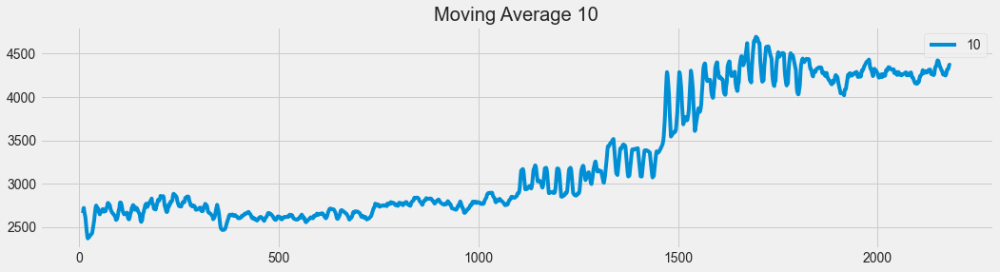

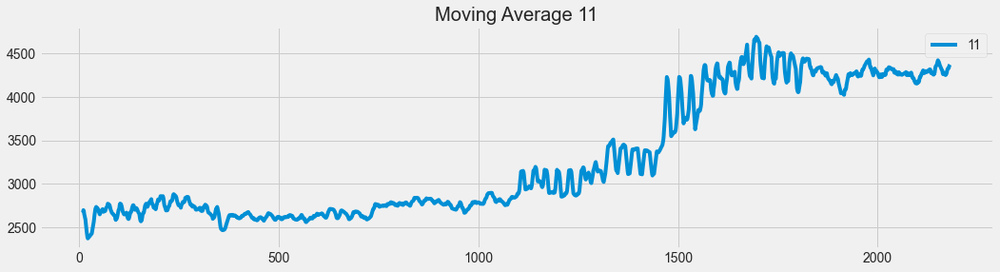

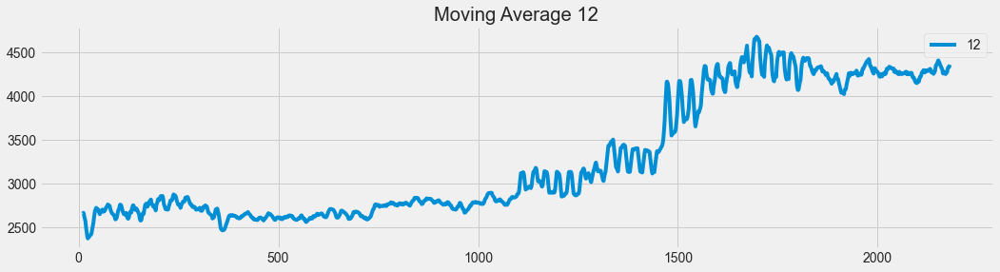

In [37]:
plt.figure(figsize=(16,4))
df.price.plot(label="org")
plt.title("Original Series")
for i in range(2,13):
    plt.figure(figsize=(16,4))
    df["price"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

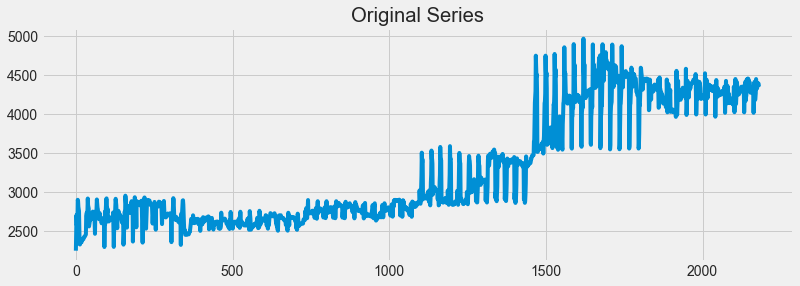

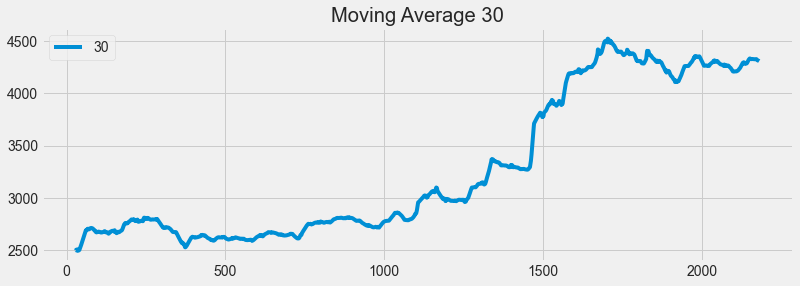

In [38]:
plt.figure(figsize=(12,4))
df.price.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(12,4))
df["price"].rolling(30).mean().plot(label=str(30))
plt.title("Moving Average "+str(30))
plt.legend(loc='best')
plt.show()

In [39]:
df.head()

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016


### Time series decomposition plot 

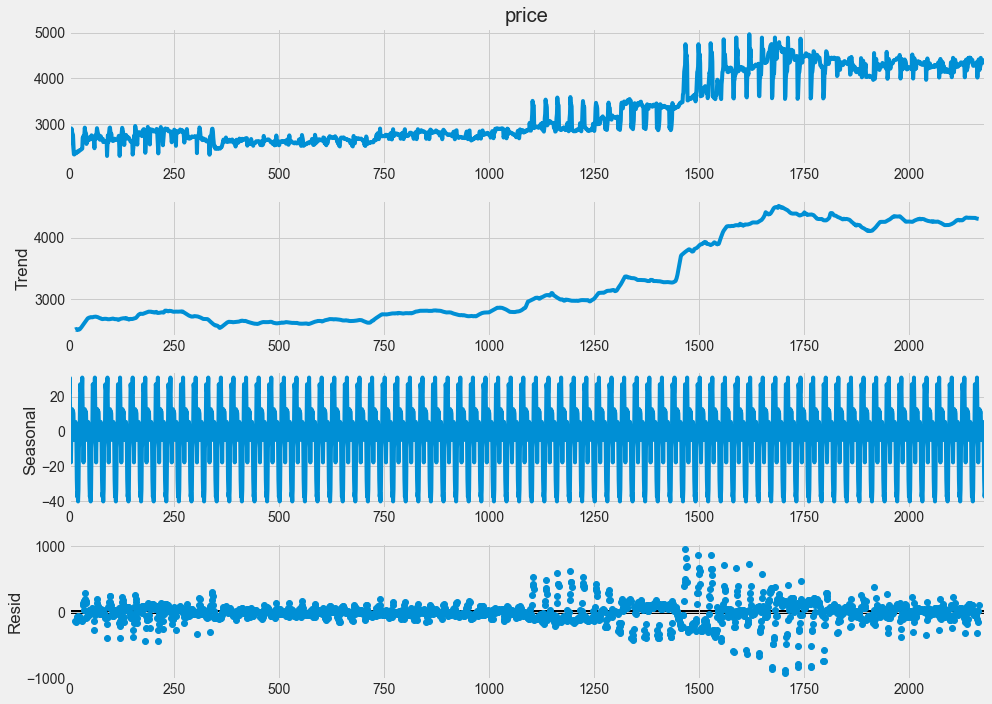

In [40]:
decompose_ts_add = seasonal_decompose(df.price,period=30)
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Autocorrelation Function (ACF)
The autocorrelation function (ACF) is a statistical technique that we can use to identify how correlated the values in a time series are with each other. The ACF plots the correlation coefficient against the lag, which is measured in terms of a number of periods or units. A lag corresponds to a certain point in time after which we observe the first value in the time series.

The correlation coefficient can range from -1 (a perfect negative relationship) to +1 (a perfect positive relationship). A coefficient of 0 means that there is no relationship between the variables. Also, most often, it is measured either by Pearson’s correlation coefficient or by Spearman’s rank correlation coefficient.

It’s most often used to analyze sequences of numbers from random processes, such as economic or scientific measurements. It can also be used to detect systematic patterns in correlated data sets such as securities prices or climate measurements. Usually, we can calculate the ACF using statistical packages from Python and R or using software such as Excel and SPSS. Below, we can see an example of the ACF plot:

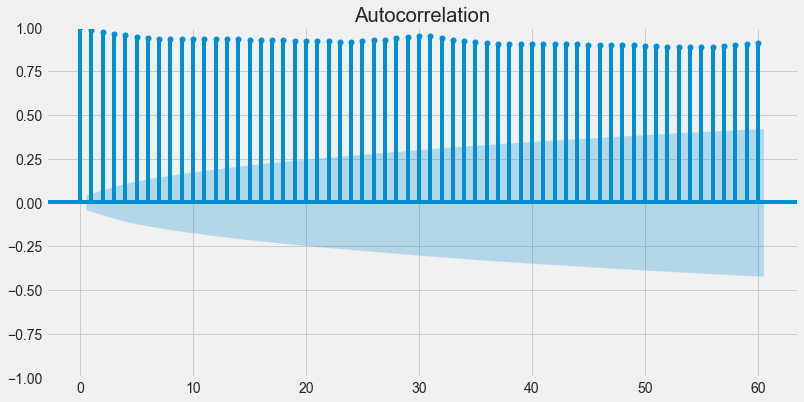

In [41]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_acf(df.price,lags=60)
    plt.show()

#### Partial Autocorrelation Function (PACF)
Partial autocorrelation is a statistical measure that captures the correlation between two variables after controlling for the effects of other variables. For example, if we’re regressing a signal S at lag t (S_{t}) with the same signal at lags t-1, t-2 and t-3 (S_{t-1}, S_{t-2}, S_{t-3}), the partial correlation between S_{t} and S_{t-3} is the amount of correlation between S_{t} and S_{t-3} that isn’t explained by their mutual correlations with S_{t-1} and S_{t-2}.

That being said, the way of finding PACF between S_{t} and S_{t-3} is to use regression model

(1) \begin{align*} S_{t} = \phi_{1}S_{t-1} + \phi_{2}S_{t-2} + \phi_{3}S_{t-3} + \epsilon \end{align*}

where  \phi_{1}, \phi_{2} and \phi_{3} are coefficients and \epsilon is error. From the regression formula above, the PACF value between S_{t} and S_{t-3} is the coefficient \pi_{3}. This coefficient will give us direct effect of time-series S_{t-3} to the time-series S_{t} because the effects of S_{t-2} and S_{t-1} are already captured by \phi_{1} and \phi_{2}.

The figure below presents the PACF plot:

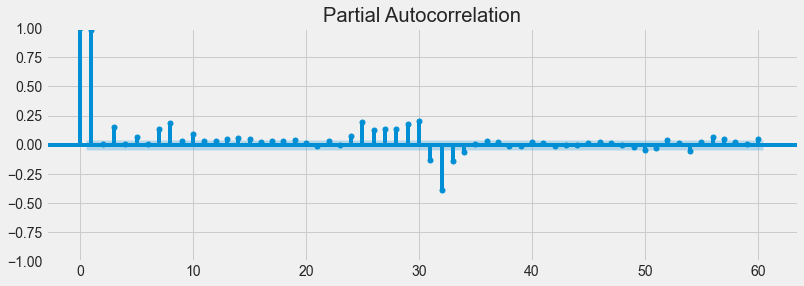

In [42]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

#### To summarize, a partial autocorrelation function captures a “direct” correlation between time series and a lagged version of itself.

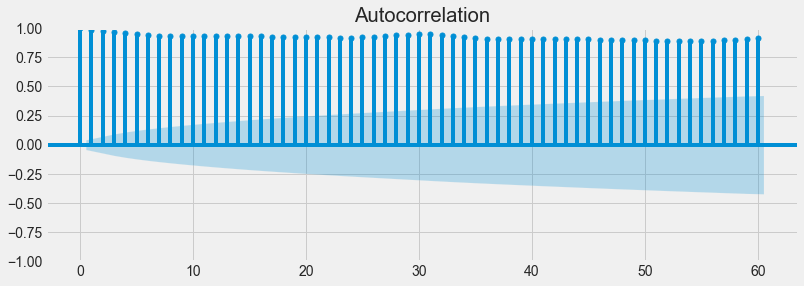

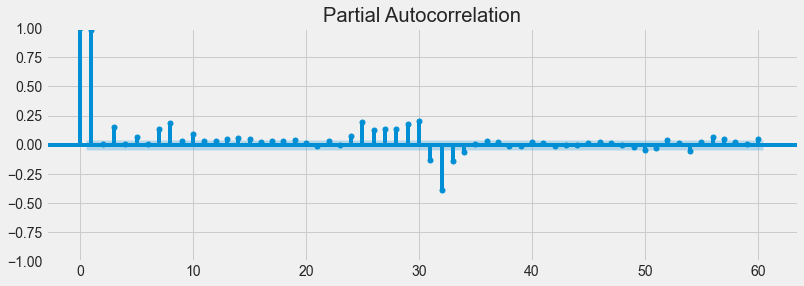

In [43]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df.price,lags=60)
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

In [44]:
visual = df1.copy()
visual.reset_index(inplace=True)
visual['date'] = pd.to_datetime(visual['date'])
visual['year'] = visual['date'].dt.year
visual['month'] = visual['date'].dt.month
visual['week'] = visual['date'].dt.isocalendar().week
visual['quarter'] = visual['date'].dt.quarter
visual['day_of_week'] = visual['date'].dt.day_name()
#visual.drop('date', axis =1 , inplace= True)
visual.head(10)

,date,price,year,month,week,quarter,day_of_week
0,2016-01-01,2252.60,2016,1,53,1,Friday
1,2016-01-02,2454.50,2016,1,53,1,Saturday
2,2016-01-03,2708.10,2016,1,53,1,Sunday
3,2016-01-04,2577.80,2016,1,1,1,Monday
4,2016-01-05,2597.75,2016,1,1,1,Tuesday
5,2016-01-06,2617.70,2016,1,1,1,Wednesday
6,2016-01-07,2903.80,2016,1,1,1,Thursday
7,2016-01-08,2887.80,2016,1,1,1,Friday
8,2016-01-09,2813.80,2016,1,1,1,Saturday
9,2016-01-10,2786.80,2016,1,1,1,Sunday


In [45]:
visual.year.unique()

array([2016, 2017, 2018, 2019, 2020, 2021], dtype=int64)

1) Seasonality
Seasonality is a simple term that means while predicting a time series data there are some months in a particular domain where the output value is at a peak as compared to other months. for example if you observe the data of tours and travels companies of past 3 years then you can see that in November and December the distribution will be very high due to holiday season and festival season. So while forecasting time series data we need to capture this seasonality.

2) Trend
The trend is also one of the important factors which describe that there is certainly increasing or decreasing trend time series, which actually means the value of organization or sales over a period of time and seasonality is increasing or decreasing.

### Additive Seasonal Decomposition

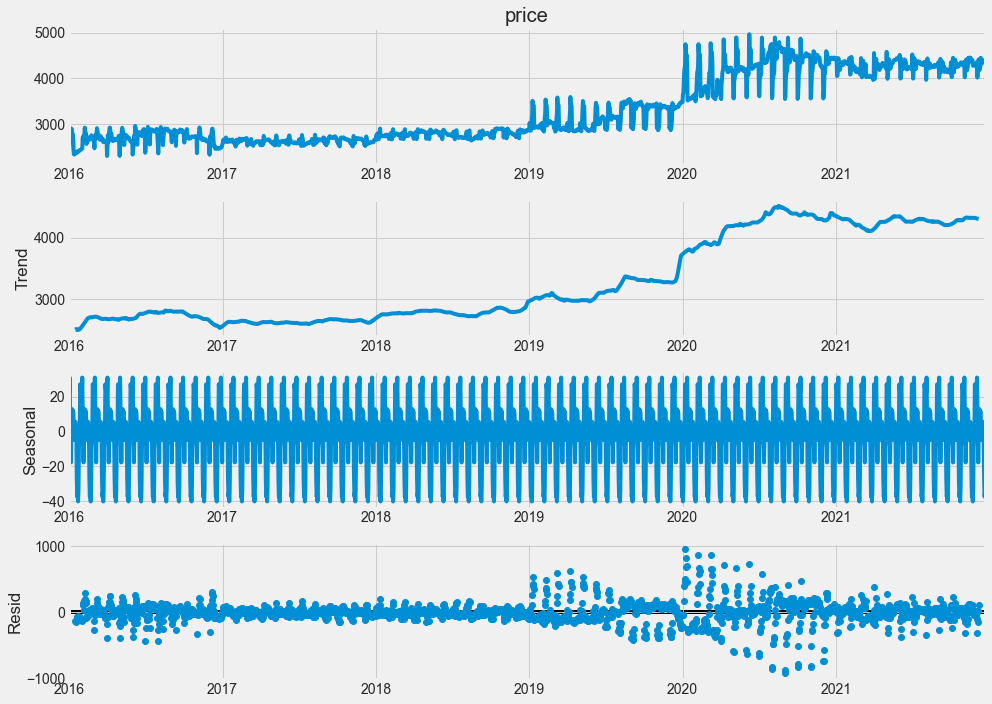

In [46]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='additive')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-
1. ***Observed*** - Actual data
2. ***Trend*** - Increasing trend.
3. ***Seasonal*** - 
    - Varies from -40 to +30 with the mean 0. 
    - Each cycle represents each month trend.
    - The value in the Y-axis has to be `added` to the Trend plot value to get the actual value of that year. 
4. ***Residual*** - It is the noise pattern of the time series data for each month, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

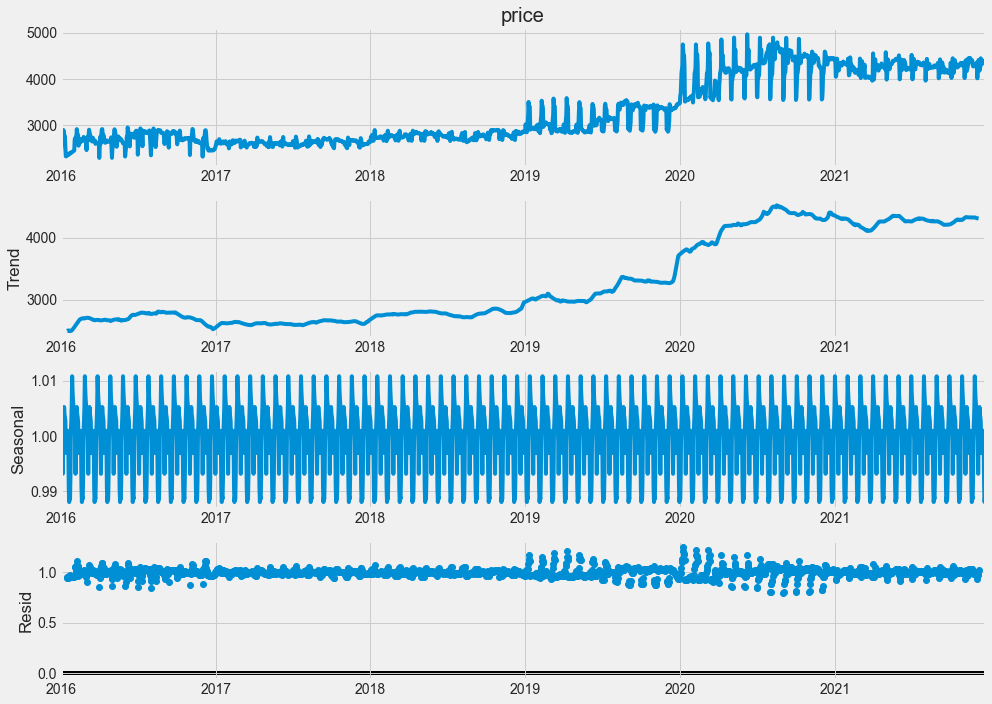

In [47]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-

***Seasonal*** - 
1. Varies from 0.985 to 1.1 
2. The value in the Y-axis has to be `multiplied` to the Trend plot value to get the actual value of that year. 

### Splitting Train and Test Data
#### Leaving Test Data with 1 months of Time Series

In [48]:
size = -30
train_data = df1[:size]
test_data = df1[size:]

In [49]:
train_data

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75
...,...
2021-11-17,4443.80
2021-11-18,4423.30
2021-11-19,4410.10


In [50]:
print('Train:',train_data.index.min(),train_data.index.max(),'\n',
'Test:',test_data.index.min(),test_data.index.max())

Train: 2016-01-01 00:00:00 2021-11-21 00:00:00 
 Test: 2021-11-22 00:00:00 2021-12-21 00:00:00


We are going to forecat for the last one months. 

Last 30 records 

<AxesSubplot:xlabel='date'>

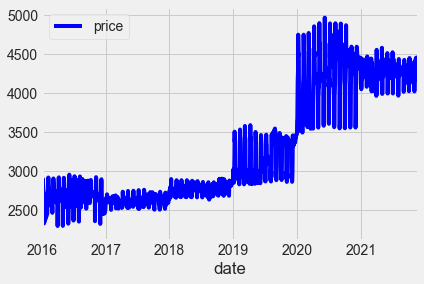

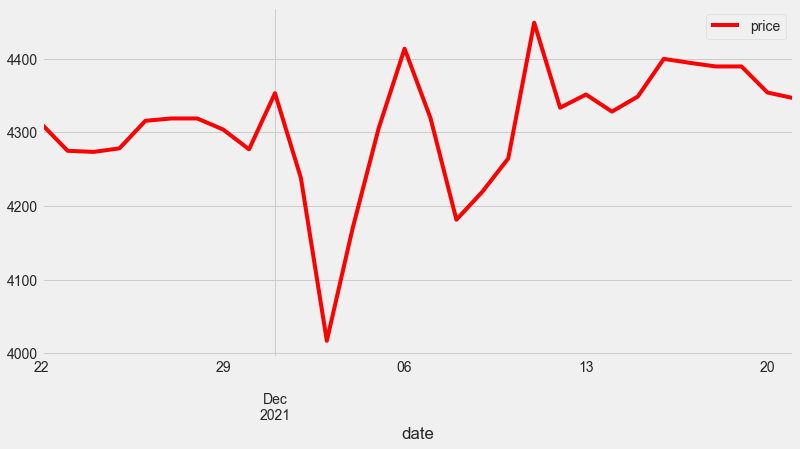

In [51]:
train_data.plot(legend=True,label='TRAIN',color='blue')
test_data.plot(legend=True,label='TEST', figsize=(12,6),color='red')

### Evaluation Metric MAPE

In [52]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

___
## Exponential Methods
### Simple Exponential Method

#### Using Forecast Attribute

In [53]:
ses_model = SimpleExpSmoothing(train_data['price']).fit(optimized=True)
test_pred_ses = ses_model.forecast(30)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,test_data.price))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,train_data))
mape_ses = MAPE(test_pred_ses,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ses),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 2.353934131154247 
 Train Root Mean Squared Error = 114.24484670353503 
 Test Root Mean Squared Error = 127.39220500278213


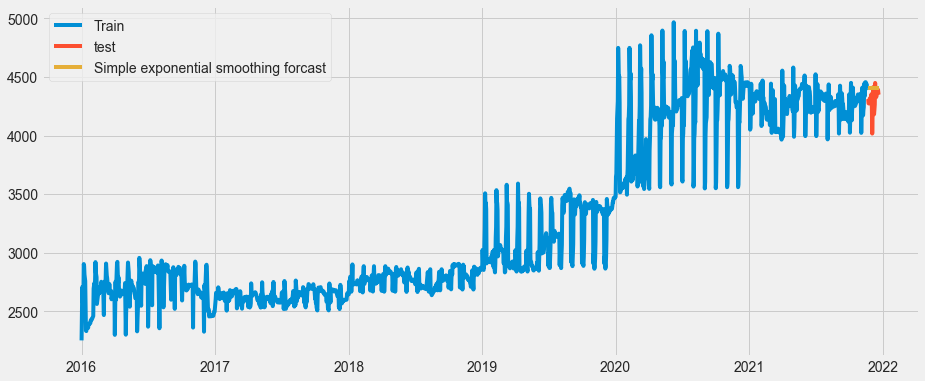

In [54]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

#### Observation
1. No seasonality captures.
2. Most recent observation gets higher weightages than the older ones for forecasting.

---
### Holt method (Double Exponential) 

##### Captures both Level and Trend .

In [55]:
dexp_model  = Holt(train_data).fit(optimized=True)
test_pred_dexp = dexp_model.forecast(30)
train_pred_dexp = dexp_model.fittedvalues
test_rmse_dexp = sqrt(mean_squared_error(test_pred_dexp,test_data.price))
train_rmse_dexp = sqrt(mean_squared_error(train_pred_dexp,train_data))
mape_dexp = MAPE(test_pred_dexp,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_dexp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_dexp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_dexp))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 3.1592142742413722 
 Train Root Mean Squared Error = 115.49196591008256 
 Test Root Mean Squared Error = 155.38761277074948


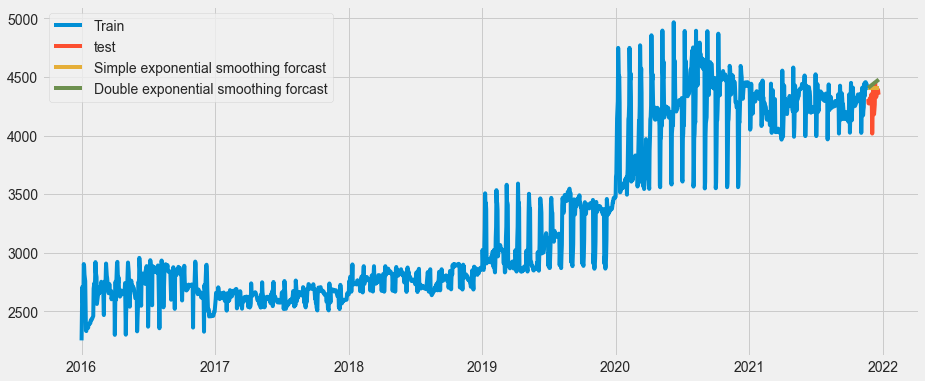

In [56]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that we are able to capture the trend of the data.
2. We were not able to capture the seasonality.

### Holts winter exponential smoothing with additive seasonality and trend (Triple Exponential)


##### Captures Level, Trend and Seasonality.



In [57]:
texp_add_model  = ExponentialSmoothing(train_data,seasonal="add",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_ad_texp = texp_add_model.forecast(30)
train_pred_ad_texp = texp_add_model.fittedvalues
test_rmse_ad_texp = sqrt(mean_squared_error(test_pred_ad_texp,test_data.price))
train_rmse_ad_texp = sqrt(mean_squared_error(train_pred_ad_texp,train_data))
mape_ad_texp = MAPE(test_pred_ad_texp,test_data.price)
print('Triple Exponential with Additive Trend and Seosonality Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_texp))

Triple Exponential with Additive Trend and Seosonality Method Evaluation 
 Mean Absolute Percent Error = 5.043370251418801 
 Train Root Mean Squared Error = 122.78057010405423 
 Test Root Mean Squared Error = 236.84417197576118


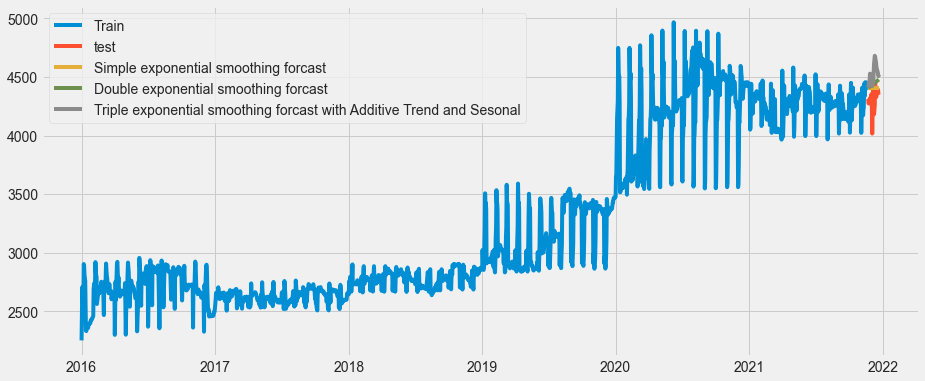

In [58]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.legend(loc='best')
plt.show()

#### Observation
1. It captures the trend, which we can see that the forecasted values are lower level than the test level.
2. It also captures the seasonality.
3. The peak of the forecasted value is higher than the actual.

### Holts winter exponential smoothing with multiplicative seasonality and additive trend (Triple Exponential)




In [59]:
texp_mul_ad_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_mul_ad_texp = texp_mul_ad_model.forecast(30)
train_pred_mul_ad_texp = texp_mul_ad_model.fittedvalues
test_rmse_mul_ad_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,test_data.price))
train_rmse_mul_ad_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,train_data))
mape_mul_ad_texp = MAPE(test_pred_mul_ad_texp,test_data.price)
print('Triple Exponential Method with Multiplicative Seasonality and Additive Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_ad_texp))

Triple Exponential Method with Multiplicative Seasonality and Additive Trend 
 Mean Absolute Percent Error = 4.838570327492439 
 Train Root Mean Squared Error = 122.86269088649571 
 Test Root Mean Squared Error = 254.38635738017712


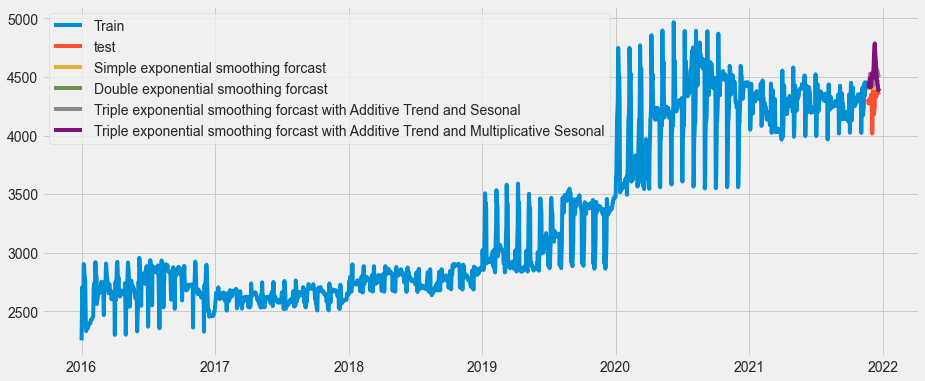

In [60]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that the errors have reduced drastically once we are able to capture the level, trend and seasonality altogether.


### Holts winter exponential smoothing with Additive seasonality and multiplicative trend (Triple Exponential)

In [61]:
texp_ad_mul_model  = ExponentialSmoothing(train_data,seasonal="add",trend="mul",seasonal_periods=30).fit(optimized=True)
test_pred_ad_mul_texp = texp_mul_ad_model.forecast(30)
train_pred_ad_mul_texp = texp_mul_ad_model.fittedvalues
test_rmse_ad_mul_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,test_data.price))
train_rmse_ad_mul_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,train_data))
mape_ad_mul_texp = MAPE(test_pred_mul_ad_texp,test_data.price)
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_mul_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_mul_texp))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error = 4.838570327492439 
 Train Root Mean Squared Error = 122.86269088649571 
 Test Root Mean Squared Error = 254.38635738017712


#### Observation
1. It captures the trend, which we can see that the forecasted values are higher level than the test level.
2. It also captures the seasonality.
3. The peak of the forecasted value is higher than the actual.

### Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend (Triple Exponential)

In [62]:
texp_ad_mul_model  = ExponentialSmoothing(train_data,seasonal="add",trend="mul",seasonal_periods=30).fit(smoothing_level=0.1, smoothing_slope=0.5)
test_pred_ad_mul_texp  = texp_ad_mul_model.forecast(30)
train_pred_ad_mul_texp  = texp_ad_mul_model.fittedvalues
test_rmse_ad_mul_texp  = sqrt(mean_squared_error(test_pred_ad_mul_texp ,test_data.price))
train_rmse_ad_mul_texp  = sqrt(mean_squared_error(train_pred_ad_mul_texp ,train_data))
mape_ad_mul_texp  = MAPE(test_pred_ad_mul_texp,test_data.price)
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_mul_texp ))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error = 21.785968201715267 
 Train Root Mean Squared Error = 280.3934594418439 
 Test Root Mean Squared Error = 1059.5762272088753


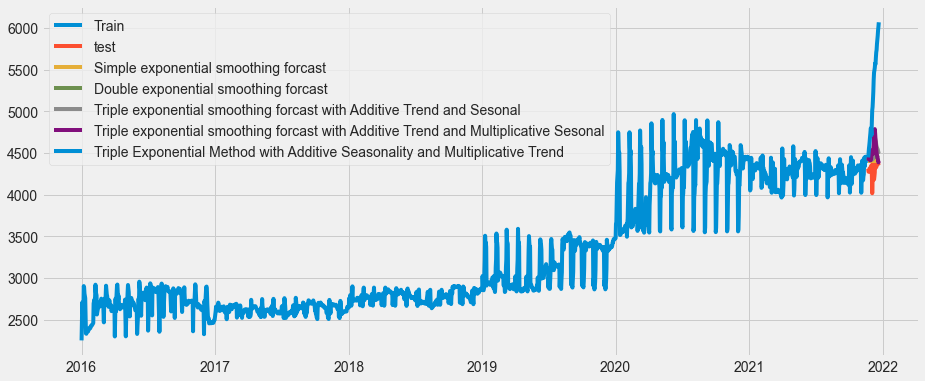

In [63]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.legend(loc='best')
plt.show()

In [64]:
texp_mul_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="mul",seasonal_periods=30).fit(optimized=True)
test_pred_mul_texp  = texp_mul_model.forecast(30)
train_pred_mul_texp  = texp_mul_model.fittedvalues
test_rmse_mul_texp  = sqrt(mean_squared_error(test_pred_mul_texp ,test_data.price))
train_rmse_mul_texp  = sqrt(mean_squared_error(train_pred_mul_texp ,train_data))
mape_mul_texp  = MAPE(test_pred_mul_texp,test_data.price)
print('Triple Exponential Method with multiplicative Trend and Seasonality',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_texp ))

Triple Exponential Method with multiplicative Trend and Seasonality 
 Mean Absolute Percent Error = 4.345981192669858 
 Train Root Mean Squared Error = 129.4557782707973 
 Test Root Mean Squared Error = 236.46706803836588


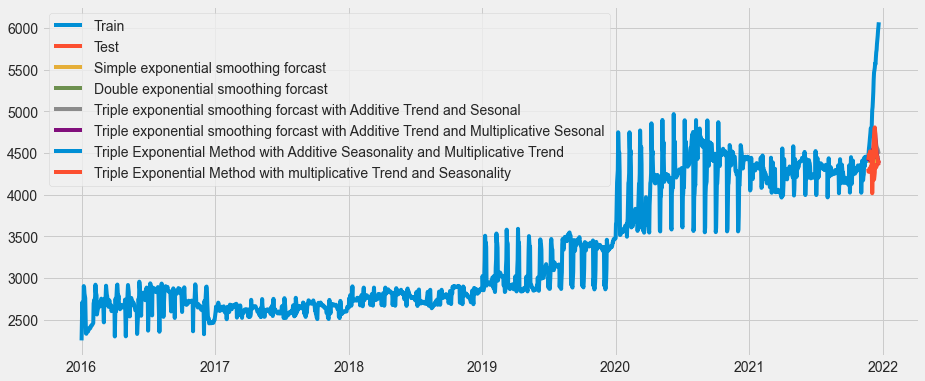

In [65]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.plot(test_pred_mul_texp, label='Triple Exponential Method with multiplicative Trend and Seasonality')
plt.legend(loc='best')
plt.show()

In [66]:
#Comparing the results 

Evaluation = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_Exp_ad","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_mul"]),\
        "Train_RMSE":pd.Series([train_rmse_ses,train_rmse_dexp,train_rmse_ad_texp,train_rmse_mul_ad_texp,train_rmse_ad_mul_texp,train_rmse_mul_texp]),\
        "Test_MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp]),\
        "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_MAPE(%)'], inplace=True, ignore_index=True)
table_evaluation

,Models,Train_RMSE,Test_MAPE(%),Test_RMSE_Values
0,Simple_Exp,114.244847,2.353934,127.392205
1,Double_Exp,115.491966,3.159214,155.387613
2,Triple_Exp_mul,129.455778,4.345981,236.467068
3,Triple_Exp_mul_ad,122.862691,4.838570,254.386357
4,Triple_Exp_ad,122.780570,5.043370,236.844172
5,Triple_Exp_ad_mul,280.393459,21.785968,1059.576227


### Visualizing Models Performance


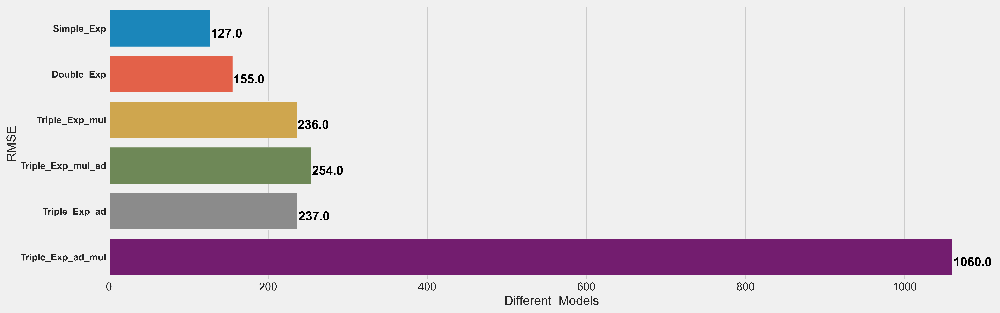

In [67]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='Test_RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.Test_RMSE_Values.values,0)):
    axe.text(v + 1, i + .20, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

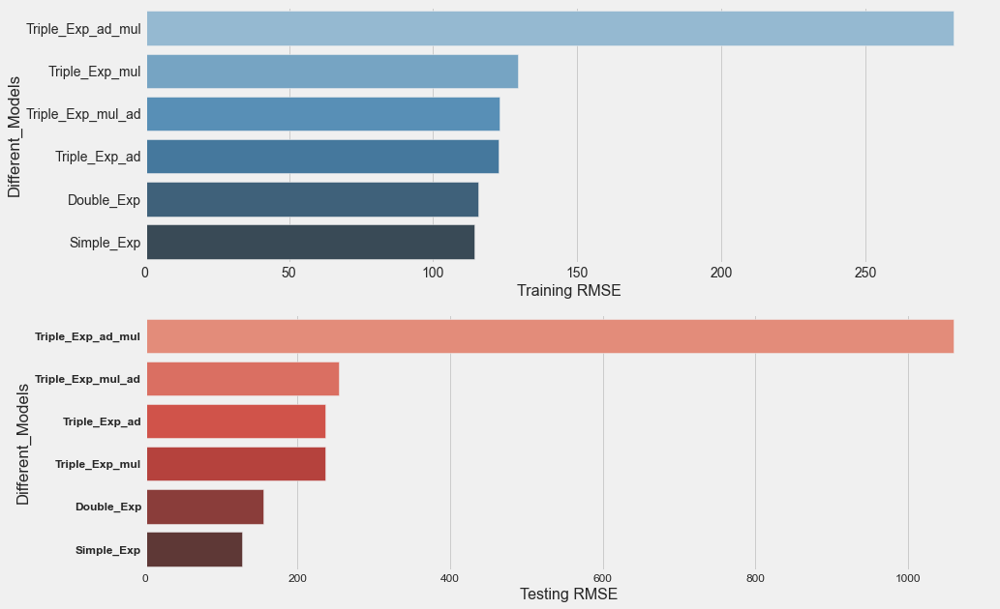

In [68]:
f, axes = plt.subplots(2,1, figsize=(14,10))
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=12)
train_rmse = table_evaluation.sort_values(by=['Train_RMSE'], ascending=False)

sns.barplot(x='Train_RMSE', y='Models', data = train_rmse, palette='Blues_d', ax = axes[0])
axes[0].set_xlabel('Training RMSE', size=16)
axes[0].set_ylabel('Different_Models')

test_rmse = table_evaluation.sort_values(by=['Test_RMSE_Values'], ascending=False)

sns.barplot(x='Test_RMSE_Values', y='Models', data = test_rmse, palette='Reds_d', ax = axes[1])
axes[1].set_xlabel('Testing RMSE', size=16)
axes[1].set_ylabel('Different_Models')

plt.show()

# Autoregressive Integrated Moving Averages (ARIMA)

Recall that an <strong>AR(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \varepsilon_{t}$

while an <strong>MA(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = \mu + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

where $c$ is a constant, $\mu$ is the expectation of $y_{t}$ (often assumed to be zero), $\phi_1$ is the AR lag coefficient, $\theta_1$ (theta-sub-one) is the MA lag coefficient, and $\varepsilon$ (epsilon) is white noise.

An <strong>ARMA(1,1)</strong> model therefore follows

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$
#### Stationary vs Non-stationary Time Series


### Test of Stationarity


##### As we have yearly data the window size for moving average is equal to 12



In [69]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=30).mean()
    movingSTD = timeseries.rolling(window=30).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['price'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

#### Augmented Dicky Fuller Test
Null Hypothesis (H0): The series is not stationary

p-val > 0.05

Alternate Hypothesis (H1): The series is stationary

p-val <= 0.05

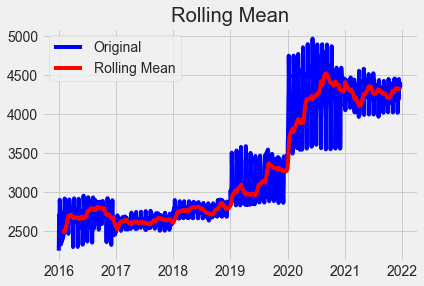

Results of Dickey Fuller Test:
Test Statistic                   -0.309904
p-value                           0.924090
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [70]:
gold_price= pd.DataFrame()
gold_price=df1[['price']]
gold_price['price'] = df1[['price']]
test_stationarity(gold_price)

In [71]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [72]:
adf_test(gold_price)

Fail to reject the null hypothesis
Data is non-stationary


### Feature Scaling (Transformations)

#### Square Root Transform



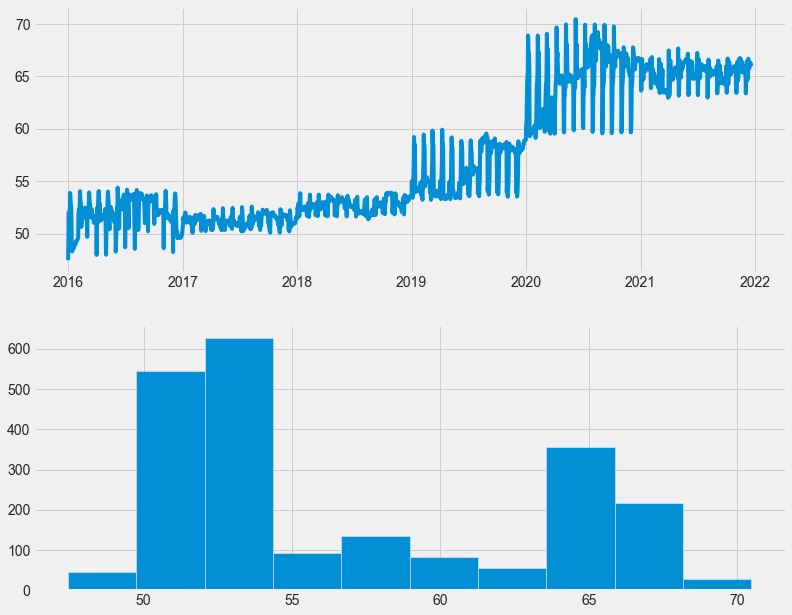

In [73]:
square_root= pd.DataFrame()
square_root = df1[['price']]
square_root['price'] = np.sqrt(square_root.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(square_root['price'])
#Histogram
plt.subplot(212)
plt.hist(square_root['price'])
plt.show()

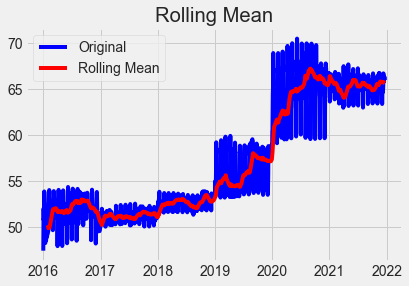

Results of Dickey Fuller Test:
Test Statistic                   -0.372419
p-value                           0.914603
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [74]:
test_stationarity(square_root)

In [75]:
adf_test(square_root)

Fail to reject the null hypothesis
Data is non-stationary


### Log Transform

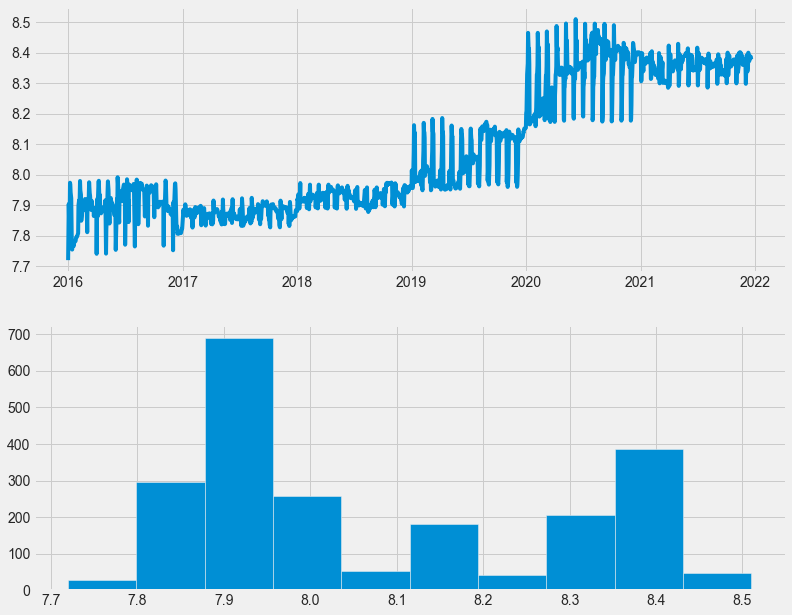

In [76]:
log = pd.DataFrame()
log = df1[['price']]
log['price'] = np.log(log.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['price'])
#Histogram
plt.subplot(212)
plt.hist(log['price'])
plt.show()

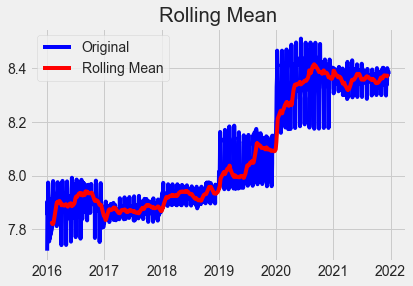

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [77]:
test_stationarity(log)

In [78]:
adf_test(log)

Fail to reject the null hypothesis
Data is non-stationary


##### Hence, the Time series data is Non-Stationary

### Converting Non-Stationary Time Series into Stationary

#### Differencing
In this method, we compute the difference of consecutive terms in the series. Differencing is typically performed to get rid of the varying mean. Mathematically, differencing can be written as:

yt‘ = yt – y(t-1)

where yt is the value at a time t

Applying differencing on our series and plotting the results:

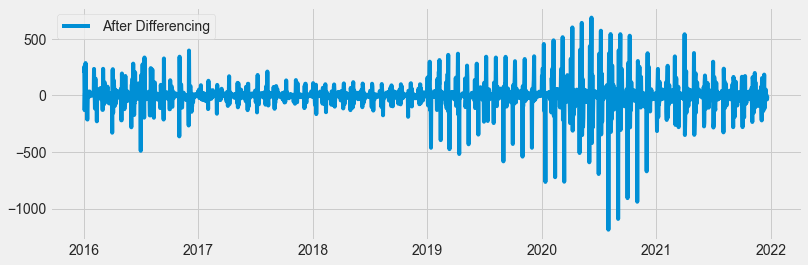

In [79]:
differencing = df1 - df1.shift(1)
differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(differencing, label='After Differencing')
plt.legend(loc='best')
plt.show()

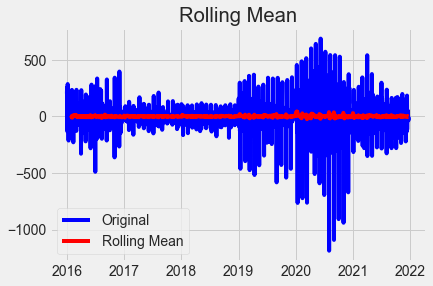

Results of Dickey Fuller Test:
Test Statistic                  -21.664542
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [80]:
test_stationarity(differencing)

In [81]:
adf_test(differencing)

Reject the null hypothesis
Data is stationary


#### Seasonal Differencing
In seasonal differencing, instead of calculating the difference between consecutive values, we calculate the difference between an observation and a previous observation from the same season. For example, an observation taken on a Monday will be subtracted from an observation taken on the previous Monday. Mathematically it can be written as:

yt‘ = yt – y(t-n)

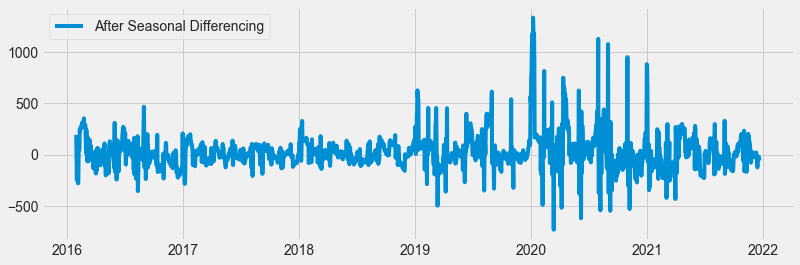

In [82]:
seasonal_differencing = df1 - df1.shift(30)
seasonal_differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(seasonal_differencing, label='After Seasonal Differencing')
plt.legend(loc='best')
plt.show()

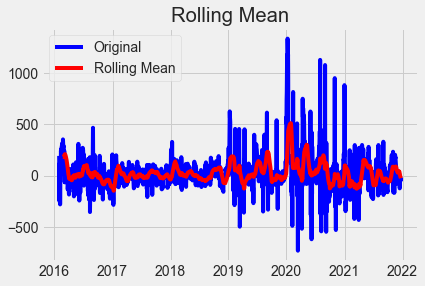

Results of Dickey Fuller Test:
Test Statistic                -1.001262e+01
p-value                        1.762328e-17
#Lags Used                     7.000000e+00
Number of Observations Used    2.144000e+03
Critical Value (1%)           -3.433404e+00
Critical Value (5%)           -2.862889e+00
Critical Value (10%)          -2.567488e+00
dtype: float64


In [83]:
test_stationarity(seasonal_differencing)

In [84]:
adf_test(seasonal_differencing)

Reject the null hypothesis
Data is stationary


#### Transformation
Transformations are used to stabilize the non-constant variance of a series. Common transformation methods include power transform, square root, and log transform. Let’s do a quick log transform and differencing on our air passenger dataset:

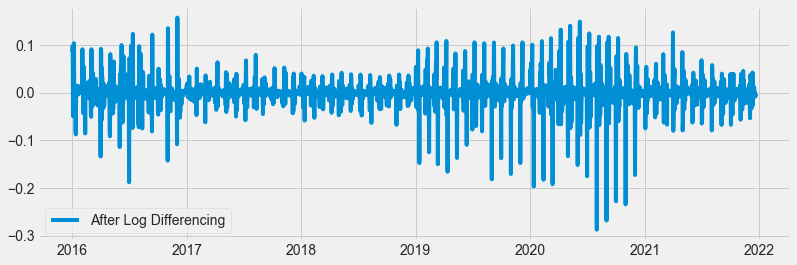

In [85]:
log_diff = log - log.shift(1)
log_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(log_diff, label='After Log Differencing')
plt.legend(loc='best')
plt.show()

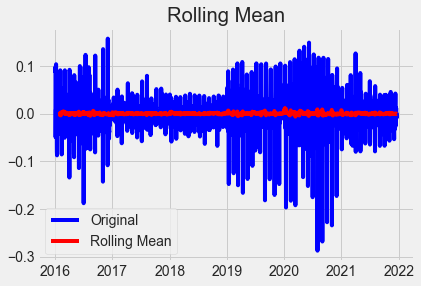

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [86]:
test_stationarity(log_diff)

In [87]:
adf_test(log_diff)

Reject the null hypothesis
Data is stationary


#### Box Cox Transformation

,price
date,
2016-01-01,7.719840
2016-01-02,7.805678
2016-01-03,7.904003
2016-01-04,7.854692
2016-01-05,7.862401


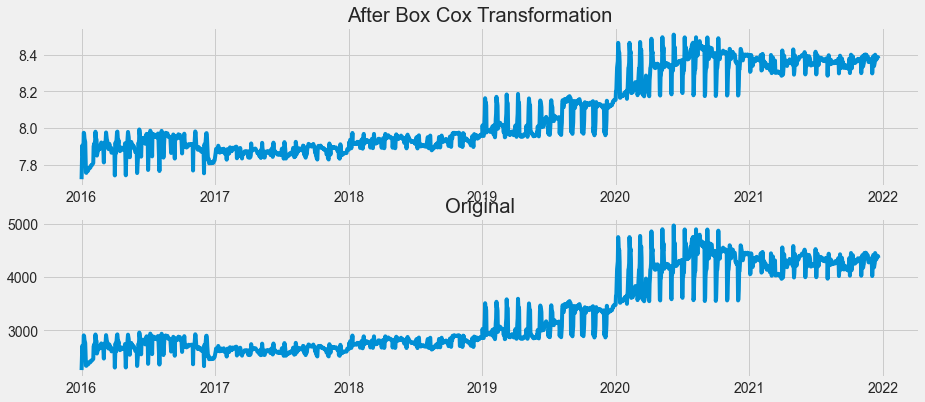

In [88]:
data_boxcox = pd.DataFrame()
data_boxcox['price'] = pd.Series(boxcox(df1['price'], lmbda=0), df1.index)
# when value  of lamda = 0 then it is a log transformation.
display(data_boxcox.head())
fig, axis = plt.subplots(2,figsize=(14,6),)
axis[0].plot(data_boxcox)
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(df1, label='original')
axis[1].set_title('Original')
plt.show()

#### Observation
1. We can see the variance became little constant after the transformation. Both in the earlier and later years the variance is little close to  similar.
2. But we can see that still the series has an upward trend. So, the mean is not constant yet. Hence, we need to do `Differencing` for making the mean constant.

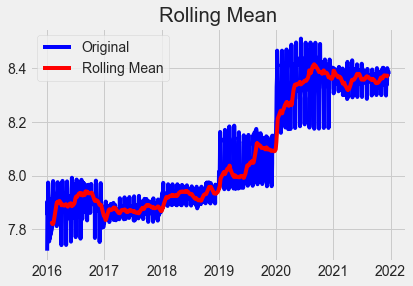

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [89]:
test_stationarity(data_boxcox)

In [90]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


#### Differencing of the Box-Cox Transformation
Differencing is performed by subtracting the previous observation from the current observation.

Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

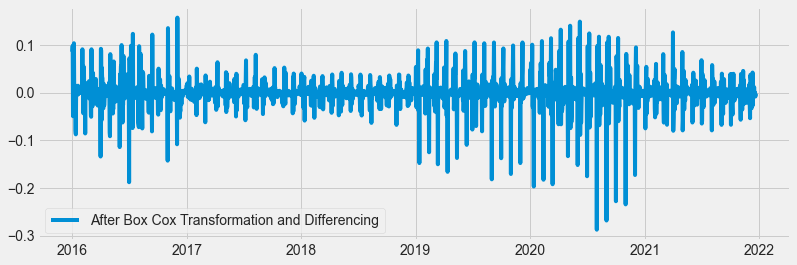

In [91]:
# data_boxcox - data_boxcox.shift() :- Performs difference between the previous and current observations.
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that there is no trend (upward or downward) after differencing on the Box Cox transformation. 
2. It is a horizontal trend.
3. The mean became constant. The mean is zero.
4. Also, the variance is little constant.

Lets test the Stationarity again.

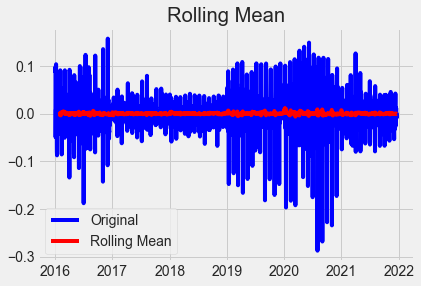

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [92]:
#check this log transfered data with function
test_stationarity(data_boxcox_diff)

In [93]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


***order(p,d,q)***

p = Periods to lag for eg: (if P= 3 then we will use the three previous periods of our time series in the autoregressive portion of the calculation) P helps adjust the line that is being fitted to forecast the series.

d = In an ARIMA model we transform a time series into stationary one(series without trend or seasonality) using differencing. D refers to the number of differencing transformations required by the time series to get stationary.


q = This variable denotes the lag of the error component, where error component is a part of the time series not explained by trend or seasonality.

In [94]:
# grid search ARIMA parameters for a time series

# evaluate an ARIMA model for a given order (p,d,q) and return RMSE
def evaluate_arima_model(X, arima_order):
# prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X)-30)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
# make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
# calculate out of sample error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

In [95]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(dataset, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except Exception as e:
                    print(e)
                    continue
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [96]:
# evaluate parameters
p_values = range(0, 3)
d_values = range(0, 3)
q_values = range(0, 3)
evaluate_models(data_boxcox_diff.price, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE=0.020


KeyboardInterrupt: 

#### Building The Time Series Forecasting with Optimal Value using ARIMA
Automatically performs the Differencing if the series has trend.

Hence, no need to manually perform the differencing.



In [96]:
train_data_boxcox = data_boxcox[:size]
test_data_boxcox = data_boxcox[size:]
train_data_boxcox_diff = data_boxcox_diff[:size]
test_data_boxcox_diff = data_boxcox_diff[size:]

##### Inverse transformation of the Box-Cox Differencing 
As we have converted the original time series to Stationary series by consecutively applying BoxCox transformation and Differencing. We have to transform the series back to the original one (step by step).



In [97]:
model = ARIMA(train_data_boxcox_diff, order=(1, 0, 2))
model_fit = model.fit()
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['arima_forecast'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
# We did differencing. So we need to revert it by adding the consecutive observations.
# For that we are using cumsum() method
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].cumsum()
# We removed the first observations after differencing as it was null. Hence, adding the first observation back.
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].add(data_boxcox.price[0])
# Now doing the reverse transformation 
# We have done Box Cox Log Log transformation with lambda = 0
# Hence, we have to the exponential as it is the reverse of the log.
y_hat_ar['arima_forecast'] = np.exp(y_hat_ar['arima_forecast'])

In [98]:
y_hat_ar.arima_forecast[test_data.index.min():]

date
2021-11-22    3173.119228
2021-11-23    3165.388244
2021-11-24    3160.057536
2021-11-25    3156.447562
2021-11-26    3154.072550
2021-11-27    3152.584587
2021-11-28    3151.734159
2021-11-29    3151.342140
2021-11-30    3151.279847
2021-12-01    3151.454786
2021-12-02    3151.800452
2021-12-03    3152.269013
2021-12-04    3152.826059
2021-12-05    3153.446835
2021-12-06    3154.113527
2021-12-07    3154.813319
2021-12-08    3155.536986
2021-12-09    3156.277891
2021-12-10    3157.031256
2021-12-11    3157.793644
2021-12-12    3158.562580
2021-12-13    3159.336284
2021-12-14    3160.113474
2021-12-15    3160.893228
2021-12-16    3161.674882
2021-12-17    3162.457958
2021-12-18    3163.242112
2021-12-19    3164.027098
2021-12-20    3164.812736
2021-12-21    3165.598900
Name: arima_forecast, dtype: float64

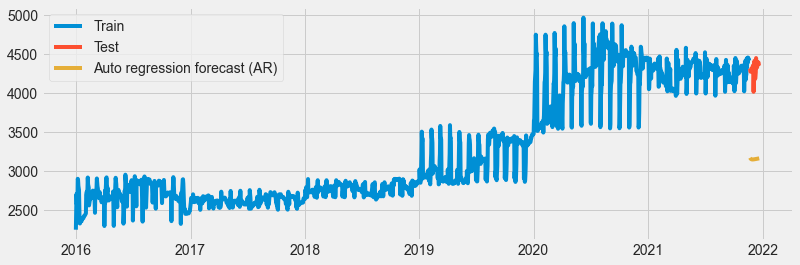

In [99]:
plt.figure(figsize=(12,4))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_ar['arima_forecast'][test_data.index.min():], label='Auto regression forecast (AR)')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that we can see that the forecastd values are highly dispersed from the actual one.
2. No Seasonality captured. Only Trend has been captured


### Model Evaluation

#### RMSE (Root Mean Squared Error)

In [100]:
rmse_ARIMA = np.sqrt(mean_squared_error(test_data, y_hat_ar['arima_forecast'][test_data.index.min():])).round(2)
rmse_ARIMA

1153.09

#### MAPE (Mean Absolute Percent Error)

In [101]:
mape_arima = round(np.mean(np.abs((test_data.price - y_hat_ar['arima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_arima

26.67

### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero



In [102]:
model_residual = model_fit.resid
model_residual.mean()

0.00015109047375492783

#### Residuals must be stationary


In [103]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


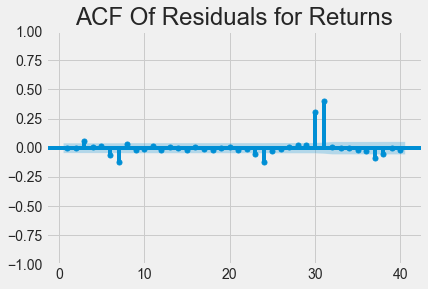

In [104]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

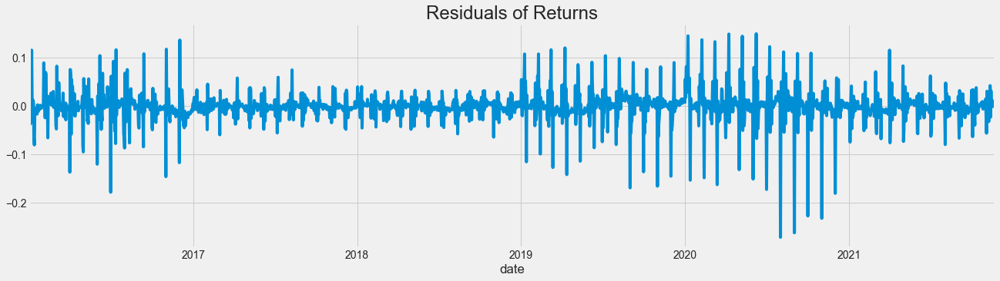

In [105]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

### Seasonal Auto Regressive Integrated Moving Average (SARIMA)
ARIMA with Seasonal component added.

In [106]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# We are only passing the Box Cox because the SARIMAX will perform the differencing internally
# seasonal_order P=1, Q=1, D=1 and m=12
# m=12 . Because the seasonality is monthly.

In [107]:
model = SARIMAX(train_data_boxcox, order=(1,1,2), seasonal_order=(1,1,1,12)) 
model_fit= model.fit()
y_hat_sarima = data_boxcox_diff.copy()



#print(model_fit.summary().tables[1])

#model_fit.plot_diagnostics(figsize=(15, 12))
#plt.show()

# pred = model_fit.get_prediction(start=pd.to_datetime('1998-01-01'), dynamic=False)
#pred

# pred_ci = pred.conf_int()
# pred_ci

#### The model is fit by calling the fit() function.

* Fitting the model returns an instance of the SARIMAXResults class. 
* This object contains the details of the fit, such as the data and coefficients, as well as functions that can be used to make use of the model.


model_fit = model.fit()


* A forecast can be made by calling the forecast() or the predict() functions on the SARIMAXResults object returned from calling fit.

* The forecast() function takes a single parameter that specifies the number of out of sample time steps to forecast, or assumes a one step forecast if no arguments are provided.


yhat = model_fit.forecast()


* The predict() function requires a start and end date or index to be specified.

* Additionally, if exogenous variables were provided when defining the model, they too must be provided for the forecast period to the predict() function.



yhat = model_fit.predict(start=len(data), end=len(data))






In [150]:
y_hat_sarima.head()

,price
date,
2016-01-02,0.085838
2016-01-03,0.098324
2016-01-04,-0.049311
2016-01-05,0.007709
2016-01-06,0.007650


#### Inverse Transformation of the Differencing Box-Cox Transformation
Note that SARIMAM automatically takes care of the reversing of `Differencing` (takes care the `Integration` part automatically). So, we don't need to perform the cumsum here. We only have to do the reverse of the log boc cox transformation.

In ARIMA, we had to perform the cumsum manually.

In [151]:
y_hat_sarima['sarima_forecast_boxcox'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])


In [152]:
y_hat_sarima

,price,sarima_forecast_boxcox,sarima_forecast
date,,,
2016-01-02,0.085838,7.719840,2252.600000
2016-01-03,0.098324,7.805678,2454.499997
2016-01-04,-0.049311,7.904003,2708.099998
2016-01-05,0.007709,7.854692,2577.799999
2016-01-06,0.007650,7.862401,2597.749999
...,...,...,...
2021-12-17,-0.001228,8.382122,4368.267884
2021-12-18,-0.001116,8.383395,4373.831457
2021-12-19,0.000000,8.383157,4372.791220


In [ ]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test_data.index.min():], label='SARIMA Forecast')
plt.legend(loc='best')
plt.show()

##### We can see that we are able to capture the trend and seasonality both.

### Model Evaluation

In [ ]:
res7=model_fit.resid
res7

In [ ]:
res7.plot(kind='hist')

In [ ]:
res7.plot(kind='kde')

In [ ]:
res7.describe()

In [ ]:
res7=np.array(res7)
sm.qqplot(res7,line='r')
plt.show()

### Observation: 

##### We can see that we are able to capture the trend and seasonality both.

##### Residuals are almost closely lying to zero.


#### RMSE (Root Mean Squared Error)

In [ ]:
rmse_SARIMA = np.sqrt(mean_squared_error(test_data, y_hat_sarima['sarima_forecast'][test_data.index.min():])).round(2)
rmse_SARIMA

#### MAPE (Mean Absolute Percent Error)

In [ ]:
mape_sarima = round(np.mean(np.abs((test_data.price - y_hat_sarima['sarima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_sarima

## Forecated values for 30 days by SARIMA Model:

In [ ]:
y_hat_sarima['sarima_forecast'][test_data.index.min():]

#### Observation:
1. SARIMA method has done reasonably well as it captures seasonality.
2. The performance is comparable with the other methods such as Holt's Winter additive/multiplicative, whcich also captures seasonality. |



### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero





In [ ]:
model_residual = model_fit.resid
model_residual.mean()

#### Residuals must be stationary



In [ ]:
adf_test(model_residual)

#### No autocorrelation between residuals



In [ ]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

In [ ]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()


#### Creating model with differente Transformation Technique

In [ ]:
#Compareing the results 

Evaluation = {"Models":pd.Series(["Simple_Exponential","Double_Exponential","Triple_Exp_additive","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_multiplicative","ARIMA","SARIMA"]),\
        "MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp,mape_arima,mape_sarima]),\
        "RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp,rmse_ARIMA,rmse_SARIMA])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)
table_evaluation


In [ ]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

#### Observation:
+ **The Sarima and double exponential Model did very well as compared to other Models but Holts-Winter Method did slightly better** 
**Note:Sarima with Hyperparameter tuning may get better results**
+ **Even in methods such as Triple Exponential Smoothing (Holts-Winters Method) taking Seasonality and Trend as Multiplicative gave the best restult in this case**

### Data Pre-processing for Model Driven Techniques

#### Creating Dummy Variables of the Categorical Feature Month of Date Time feature 

In [ ]:
df2 = df1.copy()
df2.reset_index(inplace=True)
df2['t'] = np.arange(1,len(df2)+1)
df2['t_squared'] = np.square(df2.t)
df2["month"] = df2.date.dt.strftime("%b") # month extraction
df2["year"] = df2.date.dt.strftime("%Y") # year extraction
months = pd.get_dummies(df2['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
df2 = pd.concat([df2,months],axis=1)
df2['log_price'] = np.log(df2['price'])
df2

#### Splitting data into Train and Test 

In [ ]:
train_data = df2.iloc[:size]
test_data = df2.iloc[size:]

In [ ]:
train_data

In [ ]:
test_data.shape

### Building Ordinary Square Model (Linear Model)

In [ ]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model = smf.ols('price~t',data=train_data).fit()
pred_linear =  pd.Series(linear_model.predict(pd.DataFrame(test_data['t'])))
rmse_linear = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_linear))**2))
rmse_linear

In [ ]:
linear_model.summary()

In [ ]:
#Exponential

Exp = smf.ols('log_price~t',data=train_data).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(test_data['t'])))
rmse_Exp = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Exp)))**2))
rmse_Exp

In [ ]:
Exp.summary()

In [ ]:
#Quadratic 

Quad = smf.ols('price~t+t_squared',data=train_data).fit()
pred_Quad = pd.Series(Quad.predict(test_data[["t","t_squared"]]))
rmse_Quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_Quad))**2))
rmse_Quad

In [ ]:
Quad.summary()

In [ ]:
#Additive seasonality 

add_sea = smf.ols('price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea = pd.Series(add_sea.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]))
rmse_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea))**2))
rmse_add_sea

In [ ]:
add_sea.summary()

In [ ]:
#Additive Seasonality Quadratic 

add_sea_Quad = smf.ols('price~t+t_squared+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea_quad = pd.Series(add_sea_Quad.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec','t','t_squared']]))
rmse_add_sea_quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea_quad))**2))
rmse_add_sea_quad

In [ ]:
add_sea_Quad.summary()

In [ ]:
##Multiplicative Seasonality

Mul_sea = smf.ols('log_price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_sea = pd.Series(Mul_sea.predict(test_data))
rmse_Mult_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_sea)))**2))
rmse_Mult_sea

In [ ]:
Mul_sea.summary()

In [ ]:
#Multiplicative Additive Seasonality 

Mul_Add_sea = smf.ols('log_price~t+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(test_data))
rmse_Mult_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_add_sea)))**2))
rmse_Mult_add_sea 

In [ ]:
Mul_Add_sea.summary()

In [ ]:
np.exp(pred_Mult_add_sea)

In [ ]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data['price'], label='Test')
plt.plot(np.exp(pred_Mult_add_sea), label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [ ]:
#Compare the results 

data = {"Models":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_Mult_sea","rmse_Mult_add_sea"]),"RMSE_Values":pd.Series([rmse_linear,rmse_Exp,rmse_Quad,rmse_add_sea,rmse_add_sea_quad,rmse_Mult_sea,rmse_Mult_add_sea])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)

In [ ]:
table_evaluation

In [ ]:
e = table_rmse.append(table_evaluation)
e.drop('MAPE(%)', axis=1, inplace=True)
e.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)


In [ ]:
e

In [ ]:
f, axe = plt.subplots(1,1, figsize=(12,10), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=e, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=18)

for i, v in enumerate(np.round(e.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 12)

plt.show()

# Conclusion:
## <p style="color:Green;font-size:18;">OLS linear regression model and Sarima</p><p style="color:red;font-size:14px;">The best model we have got so far with the lowest RMSE and lowest MAPE.</p>    

## Fb prophet

In [ ]:
df_prophet = pd.read_csv('Gold_data.csv')

In [ ]:
df_prophet['date'] = pd.DatetimeIndex(df['date'])
df_prophet.dtypes

In [ ]:
df2=df_prophet.copy()

In [ ]:
df2 = df2.rename(columns={'date': 'ds',
                        'price': 'y'})

df2.head()

In [ ]:
# set the uncertainty interval to 95% (the Prophet default is 80%)
my_model = Prophet(interval_width=0.95)
my_model.fit(df2)

In [ ]:
future_dates = my_model.make_future_dataframe(periods=30, freq='D')
future_dates.tail()


In [ ]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

In [ ]:
fig=my_model.plot(forecast, uncertainty=True)
fig.show()

In [ ]:

fig1=my_model.plot_components(forecast)
fig1.show()

In [ ]:
forecast_for_30days=forecast[['ds','yhat']][-30:]
forecast_for_30days.set_index('ds',inplace=True)

In [ ]:
forecast_for_30days